In [402]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

In [403]:
df=pd.read_csv('descriptors.csv')

In [404]:
df

,SMILES,CASRN,NAME,ARTICLEID,PUBMEDID,PAGE,TABLE,ERROR,nAcid,ALogP,...,P2s,E1s,E2s,E3s,Ts,As,Vs,Ks,Ds,INCHI_KEY
0,CSC1=NC(N)=C2C3=C(CCCC3)SC2=N1,-,-,-,-,-,-,-,0.0,3.211,...,0.1783,0.4862,0.4274,0.3956,13.01,29.94,54.89,0.6743,1.309,NJKBQFTUKUHCGH-UHFFFAOYSA
1,CC1=CC=CC=C1N1N=C(C=C1N)C1=CC=CS1,-,-,-,-,-,-,-,0.0,3.821,...,0.1934,0.4820,0.4558,0.3727,14.71,42.42,81.83,0.6299,1.311,VHTNHBSBZLDGFA-UHFFFAOYSA
2,CCC1=C(N)ON=C1C1=CC(Cl)=CC=C1Cl,-,-,-,-,-,-,-,0.0,3.880,...,0.1891,0.5044,0.5015,0.4246,10.12,24.18,50.53,0.5366,1.430,KSMJFQAGQCVJRJ-UHFFFAOYSA
3,NC1=CC(=NN1C1CCCC1)C1=CC=C(Cl)C=C1,-,-,-,-,-,-,-,0.0,3.871,...,0.2423,0.5047,0.4319,0.2314,13.86,41.42,75.94,0.5691,1.168,FFXUTCVPSUCBJV-UHFFFAOYSA
4,CC1=CC=C(C(C)=C1)C1=NC(N)=C2CCCCC2=N1,-,-,-,-,-,-,-,0.0,3.957,...,0.1830,0.5515,0.4851,0.3420,17.23,51.62,91.68,0.6790,1.379,DKTQBBQRRUTEIP-UHFFFAOYSA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,FC1=CC=C(CSC2=NN=NN2C2CCCC2)C=C1F,-,-,-,-,-,-,-,2.0,3.969,...,0.1450,0.6135,0.4651,0.4572,14.58,37.69,76.24,0.6808,1.536,AZKXMVHABLGMDW-UHFFFAOYSA
192,ClC1=CC=CC=C1CCC1=NC(=NO1)C1=CC=NC=C1,-,-,-,-,-,-,-,0.0,3.178,...,0.1017,0.5792,0.4462,0.2242,20.08,41.78,71.96,0.8266,1.250,WENXNPQOBITFCL-UHFFFAOYSA
193,ClC1=CC=C(OCC2=NC(=NO2)C2CC2)C(Cl)=C1,-,-,-,-,-,-,-,0.0,3.630,...,0.1063,0.5788,0.4960,0.3666,17.15,36.45,69.10,0.7902,1.441,VHYCRNFVURUMEJ-UHFFFAOYSA
194,CCC1=NN(CC2=NC(Cl)=CC=C2Cl)C(CC)=N1,-,-,-,-,-,-,-,0.0,3.801,...,0.3248,0.4722,0.4169,0.3886,12.64,43.56,91.28,0.3752,1.278,LHNKLNJBZCIRIS-UHFFFAOYSA


In [405]:
df=df.iloc[:,8:1883]

In [406]:
for i in range(df.shape[1]):
    
    
    IQR=df[df.columns[i]].quantile(0.75)-df[df.columns[i]].quantile(0.25)
    upper_lim= df[df.columns[i]].quantile(0.75)+1.5*IQR
    lower_lim=df[df.columns[i]].quantile(0.25)-1.5*IQR
    df[df.columns[i]]=np.where(df[df.columns[i]]>upper_lim,upper_lim, np.where(df[df.columns[i]]<lower_lim,lower_lim, df[df.columns[i]]))

In [407]:
from sklearn.impute import KNNImputer
imputer=KNNImputer(n_neighbors=7)

In [408]:
df_imputer=imputer.fit_transform(df)

In [409]:
df_final=pd.DataFrame(df_imputer,columns=df.columns)

In [410]:
df_final

,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,nAromBond,nAtom,nHeavyAtom,nH,...,P1s,P2s,E1s,E2s,E3s,Ts,As,Vs,Ks,Ds
0,0.0,3.211,10.31,73.13,37.13,9.0,10.0,29.0,16.0,13.0,...,0.7829,0.1783,0.4862,0.4274,0.3956,13.01,29.94,54.89,0.6743,1.309
1,0.0,3.821,14.60,77.01,39.51,16.0,18.0,31.0,18.0,13.0,...,0.7533,0.1934,0.4820,0.4558,0.3727,14.71,42.42,81.83,0.6299,1.311
2,0.0,3.880,15.06,65.47,33.39,11.0,12.0,26.0,16.0,10.0,...,0.6911,0.1891,0.5044,0.5015,0.4246,10.12,24.18,50.53,0.5366,1.430
3,0.0,3.871,14.99,74.58,40.79,11.0,12.0,34.0,18.0,16.0,...,0.7127,0.2423,0.5047,0.4319,0.2314,13.86,41.42,75.94,0.5691,1.168
4,0.0,3.957,15.65,77.17,44.13,12.0,13.0,38.0,19.0,19.0,...,0.7860,0.1830,0.5515,0.4851,0.3420,17.23,51.62,91.68,0.6790,1.379
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,0.0,3.969,15.76,78.56,40.63,11.0,11.0,34.0,20.0,14.0,...,0.7872,0.1450,0.6135,0.4651,0.4572,14.58,37.69,76.24,0.6808,1.536
192,0.0,3.178,10.10,75.70,40.68,17.0,18.0,32.0,20.0,12.0,...,0.8844,0.1017,0.5792,0.4462,0.2242,20.08,41.78,71.96,0.8266,1.250
193,0.0,3.630,13.18,66.52,35.95,11.0,11.0,28.0,18.0,10.0,...,0.8601,0.1063,0.5788,0.4960,0.3666,17.15,36.45,69.10,0.7902,1.441
194,0.0,3.801,14.45,73.02,39.22,11.0,11.0,32.0,18.0,14.0,...,0.5834,0.3248,0.4722,0.4169,0.3886,12.64,43.56,91.28,0.3752,1.278


In [411]:
df2=pd.read_csv('Compiled_data.csv')

In [412]:
df2=df2.iloc[:,1:]

In [413]:
df2.drop(['Class','IC50'],axis=1,inplace=True)

In [414]:
df_decoy=df_final[df2.columns.to_list()]

In [415]:
x=[]
for i in range(0,df2.shape[0]):
    x.append(1)
df2['D/I']=x
x=[]
for i in range(0,df_decoy.shape[0]):
    x.append(0)
df_decoy['D/I']=x

In [416]:
df_decoy

,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,nB,nN,nO,nS,...,P2s,E1s,E2s,E3s,Ts,As,Vs,Ks,Ds,D/I
0,0.0,3.211,10.31,73.13,37.13,9.0,0.0,3.0,0.0,2.0,...,0.1783,0.4862,0.4274,0.3956,13.01,29.94,54.89,0.6743,1.309,0
1,0.0,3.821,14.60,77.01,39.51,16.0,0.0,3.0,0.0,1.0,...,0.1934,0.4820,0.4558,0.3727,14.71,42.42,81.83,0.6299,1.311,0
2,0.0,3.880,15.06,65.47,33.39,11.0,0.0,2.0,1.0,0.0,...,0.1891,0.5044,0.5015,0.4246,10.12,24.18,50.53,0.5366,1.430,0
3,0.0,3.871,14.99,74.58,40.79,11.0,0.0,3.0,0.0,0.0,...,0.2423,0.5047,0.4319,0.2314,13.86,41.42,75.94,0.5691,1.168,0
4,0.0,3.957,15.65,77.17,44.13,12.0,0.0,3.0,0.0,0.0,...,0.1830,0.5515,0.4851,0.3420,17.23,51.62,91.68,0.6790,1.379,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,0.0,3.969,15.76,78.56,40.63,11.0,0.0,4.0,0.0,1.0,...,0.1450,0.6135,0.4651,0.4572,14.58,37.69,76.24,0.6808,1.536,0
192,0.0,3.178,10.10,75.70,40.68,17.0,0.0,3.0,1.0,0.0,...,0.1017,0.5792,0.4462,0.2242,20.08,41.78,71.96,0.8266,1.250,0
193,0.0,3.630,13.18,66.52,35.95,11.0,0.0,2.0,2.0,0.0,...,0.1063,0.5788,0.4960,0.3666,17.15,36.45,69.10,0.7902,1.441,0
194,0.0,3.801,14.45,73.02,39.22,11.0,0.0,4.0,0.0,0.0,...,0.3248,0.4722,0.4169,0.3886,12.64,43.56,91.28,0.3752,1.278,0


In [417]:
df_classification=pd.concat((df_decoy,df2),axis=0)

In [418]:
df_classification

,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,nB,nN,nO,nS,...,P2s,E1s,E2s,E3s,Ts,As,Vs,Ks,Ds,D/I
0,0.0,3.2110,10.310000,73.1300,37.130000,9.0,0.0,3.0,0.0,2.0,...,0.178300,0.486200,0.427400,0.395600,13.010000,29.940000,54.890000,0.674300,1.309000,0
1,0.0,3.8210,14.600000,77.0100,39.510000,16.0,0.0,3.0,0.0,1.0,...,0.193400,0.482000,0.455800,0.372700,14.710000,42.420000,81.830000,0.629900,1.311000,0
2,0.0,3.8800,15.060000,65.4700,33.390000,11.0,0.0,2.0,1.0,0.0,...,0.189100,0.504400,0.501500,0.424600,10.120000,24.180000,50.530000,0.536600,1.430000,0
3,0.0,3.8710,14.990000,74.5800,40.790000,11.0,0.0,3.0,0.0,0.0,...,0.242300,0.504700,0.431900,0.231400,13.860000,41.420000,75.940000,0.569100,1.168000,0
4,0.0,3.9570,15.650000,77.1700,44.130000,12.0,0.0,3.0,0.0,0.0,...,0.183000,0.551500,0.485100,0.342000,17.230000,51.620000,91.680000,0.679000,1.379000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,0.0,-0.2353,0.055366,42.5026,63.380618,18.0,0.0,2.0,2.0,0.0,...,0.179223,0.555734,0.436032,0.416475,25.082819,104.722507,228.173732,0.650642,1.408241,1
580,0.0,0.0343,0.001176,49.4782,67.438997,18.0,0.0,3.0,1.0,0.0,...,0.122371,0.542853,0.425386,0.409096,31.015638,120.321795,242.167770,0.766816,1.377335,1
581,0.0,-2.2591,5.103533,17.2235,37.879930,12.0,0.0,0.0,6.0,0.0,...,0.201804,0.576931,0.436802,0.419852,13.893438,44.930991,97.623484,0.542578,1.433585,1
582,0.0,-2.2591,5.103533,17.2235,37.879930,12.0,0.0,0.0,6.0,0.0,...,0.202802,0.561348,0.511168,0.348289,14.810341,43.607131,82.880638,0.621288,1.420805,1


In [419]:
df_final

,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,nAromBond,nAtom,nHeavyAtom,nH,...,P1s,P2s,E1s,E2s,E3s,Ts,As,Vs,Ks,Ds
0,0.0,3.211,10.31,73.13,37.13,9.0,10.0,29.0,16.0,13.0,...,0.7829,0.1783,0.4862,0.4274,0.3956,13.01,29.94,54.89,0.6743,1.309
1,0.0,3.821,14.60,77.01,39.51,16.0,18.0,31.0,18.0,13.0,...,0.7533,0.1934,0.4820,0.4558,0.3727,14.71,42.42,81.83,0.6299,1.311
2,0.0,3.880,15.06,65.47,33.39,11.0,12.0,26.0,16.0,10.0,...,0.6911,0.1891,0.5044,0.5015,0.4246,10.12,24.18,50.53,0.5366,1.430
3,0.0,3.871,14.99,74.58,40.79,11.0,12.0,34.0,18.0,16.0,...,0.7127,0.2423,0.5047,0.4319,0.2314,13.86,41.42,75.94,0.5691,1.168
4,0.0,3.957,15.65,77.17,44.13,12.0,13.0,38.0,19.0,19.0,...,0.7860,0.1830,0.5515,0.4851,0.3420,17.23,51.62,91.68,0.6790,1.379
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,0.0,3.969,15.76,78.56,40.63,11.0,11.0,34.0,20.0,14.0,...,0.7872,0.1450,0.6135,0.4651,0.4572,14.58,37.69,76.24,0.6808,1.536
192,0.0,3.178,10.10,75.70,40.68,17.0,18.0,32.0,20.0,12.0,...,0.8844,0.1017,0.5792,0.4462,0.2242,20.08,41.78,71.96,0.8266,1.250
193,0.0,3.630,13.18,66.52,35.95,11.0,11.0,28.0,18.0,10.0,...,0.8601,0.1063,0.5788,0.4960,0.3666,17.15,36.45,69.10,0.7902,1.441
194,0.0,3.801,14.45,73.02,39.22,11.0,11.0,32.0,18.0,14.0,...,0.5834,0.3248,0.4722,0.4169,0.3886,12.64,43.56,91.28,0.3752,1.278


In [420]:
df3=pd.read_csv('decoys_descriptors.csv')

In [421]:
df3=df3.iloc[:,8:]

In [422]:
df3

,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,nAromBond,nAtom,nHeavyAtom,nH,...,P1s,P2s,E1s,E2s,E3s,Ts,As,Vs,Ks,Ds
0,0.0,2.371,5.620,85.67,47.49,12.0,12.0,40.0,22.0,18.0,...,0.8711,0.09198,0.5471,0.4184,0.2863,23.16,62.04,121.90,0.8066,1.252
1,0.0,3.727,13.890,88.13,46.50,16.0,17.0,38.0,21.0,17.0,...,0.8854,0.09434,0.5732,0.5514,0.3444,23.21,55.67,100.00,0.8282,1.469
2,0.0,3.299,10.880,77.44,49.67,0.0,0.0,47.0,20.0,27.0,...,0.8359,0.10480,0.6230,0.5016,0.3993,20.29,59.06,122.80,0.7538,1.524
3,0.0,3.572,12.760,77.69,41.02,12.0,12.0,33.0,22.0,11.0,...,0.8070,0.10100,0.6102,0.4834,0.3363,18.04,53.73,115.80,0.7105,1.430
4,0.0,3.263,10.640,78.27,41.02,12.0,12.0,33.0,22.0,11.0,...,0.8017,0.12610,0.6097,0.5020,0.3204,18.31,56.35,119.50,0.7026,1.432
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1157,0.0,2.651,7.029,74.69,42.47,6.0,6.0,39.0,20.0,19.0,...,0.6884,0.17640,0.5447,0.4032,0.4954,13.43,42.99,96.19,0.5327,1.443
1158,0.0,3.112,9.686,73.55,37.48,11.0,11.0,31.0,19.0,12.0,...,0.6639,0.21590,0.5095,0.4784,0.3030,11.95,35.56,76.89,0.4959,1.291
1159,0.0,2.078,4.317,70.15,44.28,0.0,0.0,42.0,19.0,23.0,...,0.5448,0.32830,0.5668,0.4503,0.4702,11.75,40.01,88.61,0.3172,1.487
1160,0.0,2.142,4.589,72.95,45.68,0.0,0.0,42.0,20.0,22.0,...,0.6942,0.17550,0.5197,0.4239,0.4504,11.79,32.71,70.55,0.5413,1.394


In [423]:
df3=df3.sample(500)

In [424]:
for i in range(df3.shape[1]):
    IQR=1.5*(df3[df3.columns[i]].quantile(0.75)-df3[df3.columns[i]].quantile(0.25))
    upper_lim=df3[df3.columns[i]].quantile(0.75)+IQR
    lower_lim=df3[df3.columns[i]].quantile(0.25)-IQR
    df3[df3.columns[i]]=np.where(df3[df3.columns[i]]>upper_lim,upper_lim, np.where(df3[df3.columns[i]]<lower_lim,lower_lim, df3[df3.columns[i]]))

In [425]:
df4=imputer.fit_transform(df3)
df5=pd.DataFrame(df4,columns=df3.columns)

In [426]:
df5['D/I']=list(map(int,"0"*df5.shape[0]))

In [427]:
df5['SpMin8_Bhi'].isnull().value_counts()

SpMin8_Bhi
False    500
Name: count, dtype: int64

In [428]:
df_classification_final=pd.concat((df_classification,df5),axis=0)

In [429]:
df_classification_final
df_final=imputer.fit_transform(df_classification_final)
df_final=pd.DataFrame(df_final,columns=df_classification_final.columns)

In [430]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression

In [431]:
x=df_classification.drop('D/I',axis=1)
y=df_classification['D/I']
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=42,test_size=0.2,stratify=y)

In [432]:
rf=RandomForestClassifier()
rf.fit(x_train,y_train)
y_pred=rf.predict(x_test)
accuracy_score(y_test,y_pred)

1.0

In [433]:
clf3=DecisionTreeClassifier()
clf3.fit(x_train,y_train)
y_pred3=clf3.predict(x_test)
accuracy_score(y_pred3,y_test)

1.0

<Figure size 12000x6000 with 0 Axes>

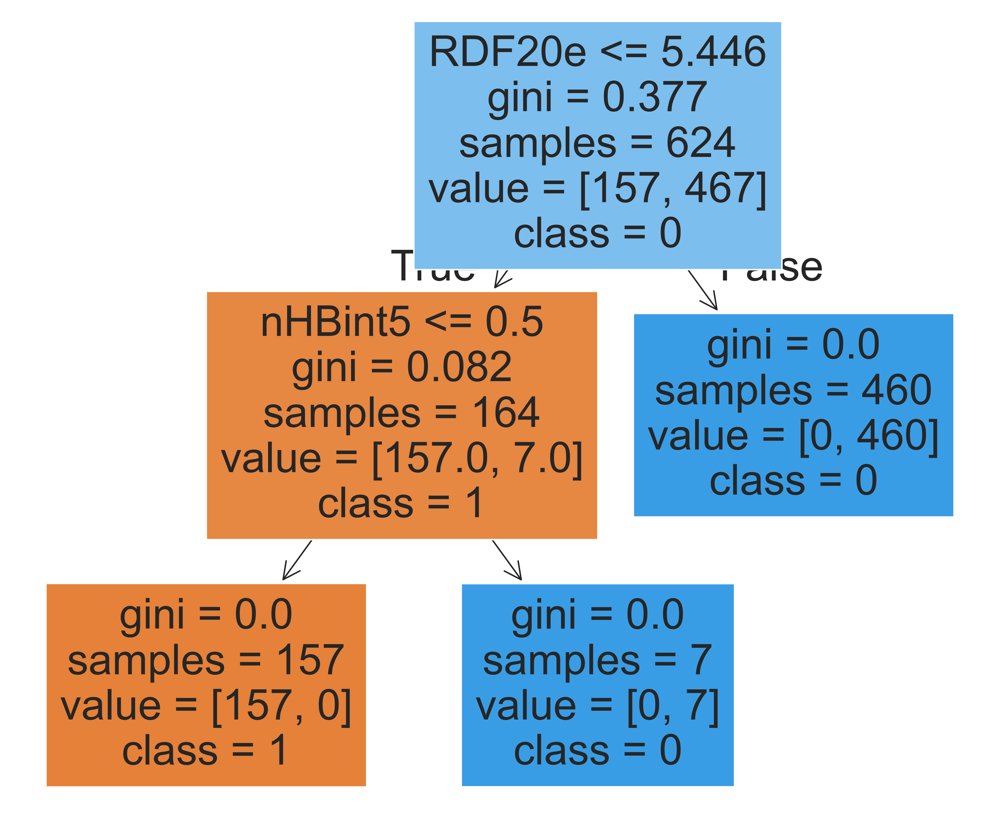

In [434]:
plt.figure(figsize=(20,10))
clf_dt=DecisionTreeClassifier()
clf_dt.fit(x_train,y_train)
texts=tree.export_text(clf_dt)
with open('decision_tree.log','w') as fout:
    fout.write(texts)
fig=plt.figure(figsize=(12,10))
ax = tree.plot_tree(clf_dt, feature_names=df_classification.columns,class_names=['1','0'], filled=True)

In [435]:
lr=LogisticRegression()
lr.fit(x_train,y_train)
y_pred2=lr.predict(x_test)
accuracy_score(y_test,y_pred2)

0.9743589743589743

In [436]:
x_train

,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,nB,nN,nO,nS,...,P1s,P2s,E1s,E2s,E3s,Ts,As,Vs,Ks,Ds
441,0.0,-3.6928,9.344183,97.3552,103.882285,18.0,0.0,4.0,4.0,0.0,...,0.832187,0.122155,0.537696,0.427453,0.375336,35.719597,174.545196,388.996728,0.748280,1.340485
57,0.0,2.3340,9.344183,96.6302,55.474204,3.0,0.0,0.0,2.0,0.0,...,0.798325,0.156868,0.563707,0.434590,0.390463,24.215526,94.715920,197.608832,0.697488,1.388760
55,0.0,-0.7894,0.623152,70.0770,67.535032,12.0,0.0,2.0,6.0,0.0,...,0.950384,0.029496,0.567224,0.469090,0.422130,40.551467,108.026686,216.288157,0.925575,1.458444
474,0.0,2.3340,9.344183,83.3242,61.661376,6.0,0.0,0.0,2.0,0.0,...,0.814282,0.150779,0.576705,0.434192,0.364687,26.745789,106.048815,211.228503,0.721423,1.375584
401,0.0,-4.0532,9.344183,109.6710,103.882285,3.0,0.0,1.0,9.0,0.0,...,0.775647,0.167915,0.496872,0.434831,0.398148,34.094044,176.705234,410.720996,0.675207,1.325629
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,0.0,-0.4735,0.224202,35.9315,44.497860,10.0,0.0,2.0,1.0,0.0,...,0.622188,0.328345,0.493659,0.468108,0.361023,13.692559,47.117530,86.752822,0.433283,1.322790
311,0.0,-0.5214,0.271858,30.9593,52.509446,16.0,0.0,4.0,0.0,0.0,...,0.665167,0.278227,0.577522,0.415100,0.416364,19.705835,92.602250,192.471270,0.497751,1.408986
323,0.0,-1.5350,2.356225,27.6438,48.792688,16.0,0.0,6.0,2.0,0.0,...,0.782933,0.168525,0.573424,0.394655,0.358709,19.367589,66.685394,131.560279,0.674400,1.326787
42,0.0,-1.2781,1.633540,30.4423,69.703411,24.0,0.0,7.0,0.0,0.0,...,0.762643,0.202453,0.506513,0.377406,0.295992,29.738589,166.339348,337.814632,0.643965,1.179911


In [437]:

# Importing functions for cross-validation and train-test splitting from sklearn
from sklearn.model_selection import cross_val_score, train_test_split

# Importing metrics for model evaluation from sklearn
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Importing seaborn for statistical data visualization
import seaborn as sns

from sklearn.metrics import recall_score,f1_score,precision_score
from sklearn import metrics

In [438]:
# plt.figure(figsize=(8, 6))
# plt.bar(x=np.arange(3), width=0.3,height=[accuracy_score(y_pred2,y_test),accuracy_score(y_pred3,y_test),accuracy_score(y_pred,y_test)],color='firebrick')
# plt.xticks(np.arange(3),['LR','DTs','RF'],fontfamily='Arial', fontsize=21, fontweight=21)
# plt.yticks(fontfamily='Arial',fontweight=21, fontsize=21)
# plt.ylabel('Accuracy',fontfamily='Arial',fontsize=21, fontweight=21)
# plt.xlabel('Algorithms',fontsize=21,fontweight=21,fontfamily='Arial')

In [439]:
recall1=recall_score(y_pred,y_test,average='weighted')
recall2=recall_score(y_pred2,y_test,average='weighted')
recall3=recall_score(y_pred3,y_test,average='weighted')
precision1=precision_score(y_pred,y_test,average='weighted')
precision2=precision_score(y_pred2,y_test,average='weighted')
precision3=precision_score(y_pred3,y_test,average='weighted')
f1_1=f1_score(y_pred,y_test,average='weighted')
f1_2=f1_score(y_pred2,y_test,average='weighted')
f1_3=f1_score(y_pred3,y_test,average='weighted')

In [440]:
# plt.bar(x=np.arange(3), height=[precision2, precision3, precision1], width=0.2, label='Precision', color='#cc5000')
# plt.bar(x=np.arange(3)-0.2, height=[recall2, recall3, recall1], width=0.2, label='Recall', color='#9bc209')
# plt.bar(x=np.arange(3)+0.2, height=[f1_2, f1_3, f1_1], width=0.2, label='F1', color='#fcc200')

# plt.legend(fontsize=4, prop={'family': 'Arial', 'size': 8}, loc='upper left', 
#            frameon=True, framealpha=0.7, borderpad=0.5, labelspacing=0.2, handlelength=0.6)

# # Other customizations
# plt.yticks(fontfamily='Arial', fontweight=21, fontsize=21)
# plt.ylabel('Metrics', fontfamily='Arial', fontweight=21, fontsize=21)
# plt.xlabel('Algorithms', fontfamily='Arial', fontweight=21, fontsize=21)
# plt.ylim(0, 1.1)
# plt.xticks(np.arange(3), ['LR', 'DTs', 'RF'], fontsize=21, fontweight=21, fontfamily='Arial')
# # Move legend outside the plot (right side)
# plt.legend(
#     fontsize=4,
#     prop={'family': 'Arial', 'size': 21, 'weight':21},
#     loc='center left',
#     bbox_to_anchor=(1.02, 0.5),  # move outside the plot
#     frameon=True,
#     framealpha=0.7,
#     borderpad=0.5,
#     labelspacing=0.2,
#     handlelength=0.6
# )

# # Save the figure with a higher resolution
# plt.rcParams['figure.dpi'] =600

# # Display the plot
# plt.show()

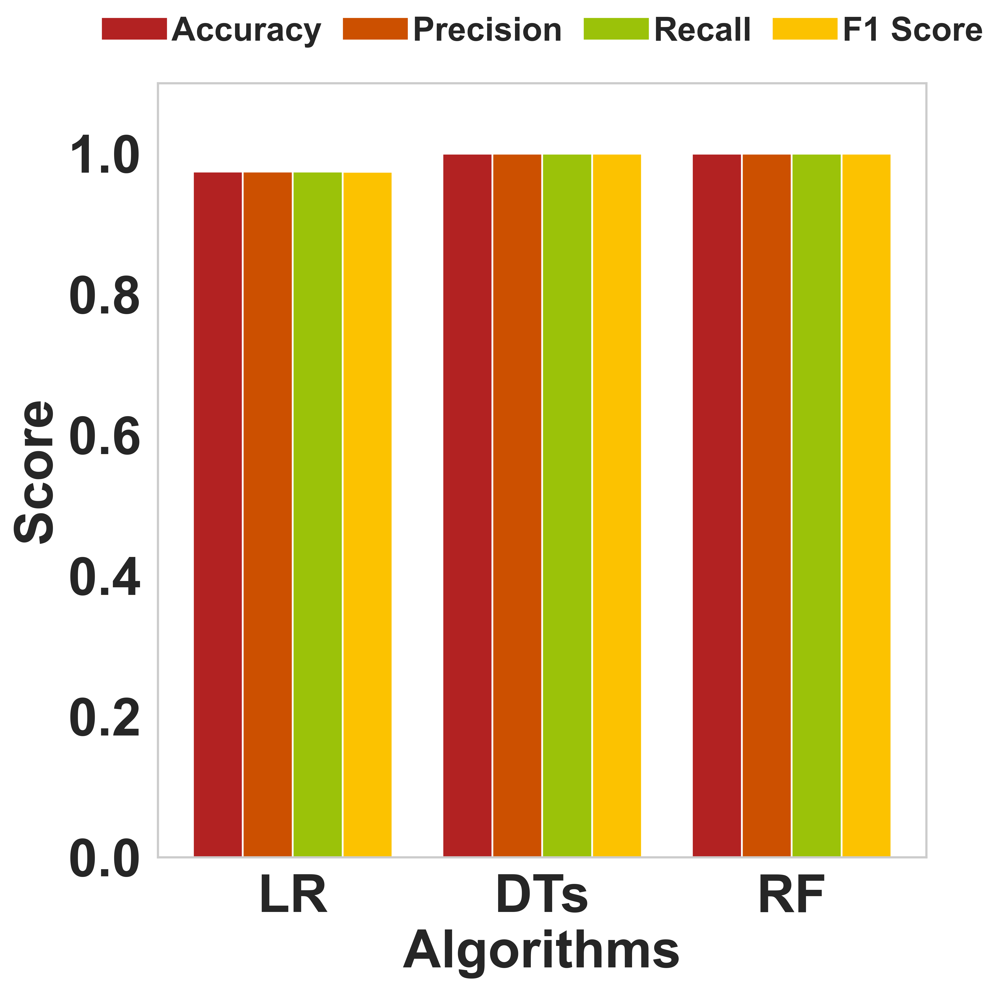

In [441]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# 1. Compute metrics for each model (replace y_predX & y_test with your actual variables)
models = ['LR', 'DTs', 'RF']
y_preds = [y_pred2, y_pred3, y_pred]  # order corresponds to models

accuracies = [accuracy_score(y_hat, y_test) for y_hat in y_preds]
precisions = [precision_score(y_hat, y_test, average='weighted') for y_hat in y_preds]
recalls    = [recall_score   (y_hat, y_test, average='weighted') for y_hat in y_preds]
f1s        = [f1_score       (y_hat, y_test, average='weighted') for y_hat in y_preds]

# 2. Plot setup
x = np.arange(len(models))
width = 0.2

plt.figure(figsize=(8, 8))
# 3. Plot each metric with an offset
plt.bar(x - 1.5*width, accuracies, width, label='Accuracy', color='firebrick')
plt.bar(x - 0.5*width, precisions, width, label='Precision', color='#cc5000')
plt.bar(x + 0.5*width, recalls,    width, label='Recall',    color='#9bc209')
plt.bar(x + 1.5*width, f1s,        width, label='F1 Score',  color='#fcc200')

# 4. Axes labels and ticks
plt.xticks(x, models, fontfamily='Arial', fontsize=30, fontweight='bold')
plt.yticks(fontfamily='Arial', fontsize=30, fontweight='bold')
plt.xlabel('Algorithms', fontfamily='Arial', fontsize=30, fontweight='bold')
plt.ylabel('Score',      fontfamily='Arial', fontsize=30, fontweight='bold')
plt.ylim(0, 1.1)

# 5. Legend on top, horizontal
plt.legend(
    ncol=4,
    handletextpad=0.11,    # tighten marker‐text gap
    labelspacing=0.08,     # tighten entry spacing
    columnspacing=0.6,    # tighten column gaps
    borderpad=0.12,        # tighten frame padding
    borderaxespad=0.20,    # tighten axes‐legend gap
    loc='upper center',
    bbox_to_anchor=(0.5, 1.1),
    frameon=False,
    framealpha=0.7,
    prop={'family': 'Arial', 'weight':'bold', 'size':19}
)

plt.grid(False)
plt.tight_layout()  # adjust to make room for legend
plt.savefig('combined_metrics_model1.png', dpi=600, format='png')
plt.show()


In [442]:
df.head()

,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,nAromBond,nAtom,nHeavyAtom,nH,...,P1s,P2s,E1s,E2s,E3s,Ts,As,Vs,Ks,Ds
0,0.0,3.211,10.31,73.13,37.13,9.0,10.0,29.0,16.0,13.0,...,0.7829,0.1783,0.4862,0.4274,0.3956,13.01,29.94,54.89,0.6743,1.309
1,0.0,3.821,14.60,77.01,39.51,16.0,18.0,31.0,18.0,13.0,...,0.7533,0.1934,0.4820,0.4558,0.3727,14.71,42.42,81.83,0.6299,1.311
2,0.0,3.880,15.06,65.47,33.39,11.0,12.0,26.0,16.0,10.0,...,0.6911,0.1891,0.5044,0.5015,0.4246,10.12,24.18,50.53,0.5366,1.430
3,0.0,3.871,14.99,74.58,40.79,11.0,12.0,34.0,18.0,16.0,...,0.7127,0.2423,0.5047,0.4319,0.2314,13.86,41.42,75.94,0.5691,1.168
4,0.0,3.957,15.65,77.17,44.13,12.0,13.0,38.0,19.0,19.0,...,0.7860,0.1830,0.5515,0.4851,0.3420,17.23,51.62,91.68,0.6790,1.379


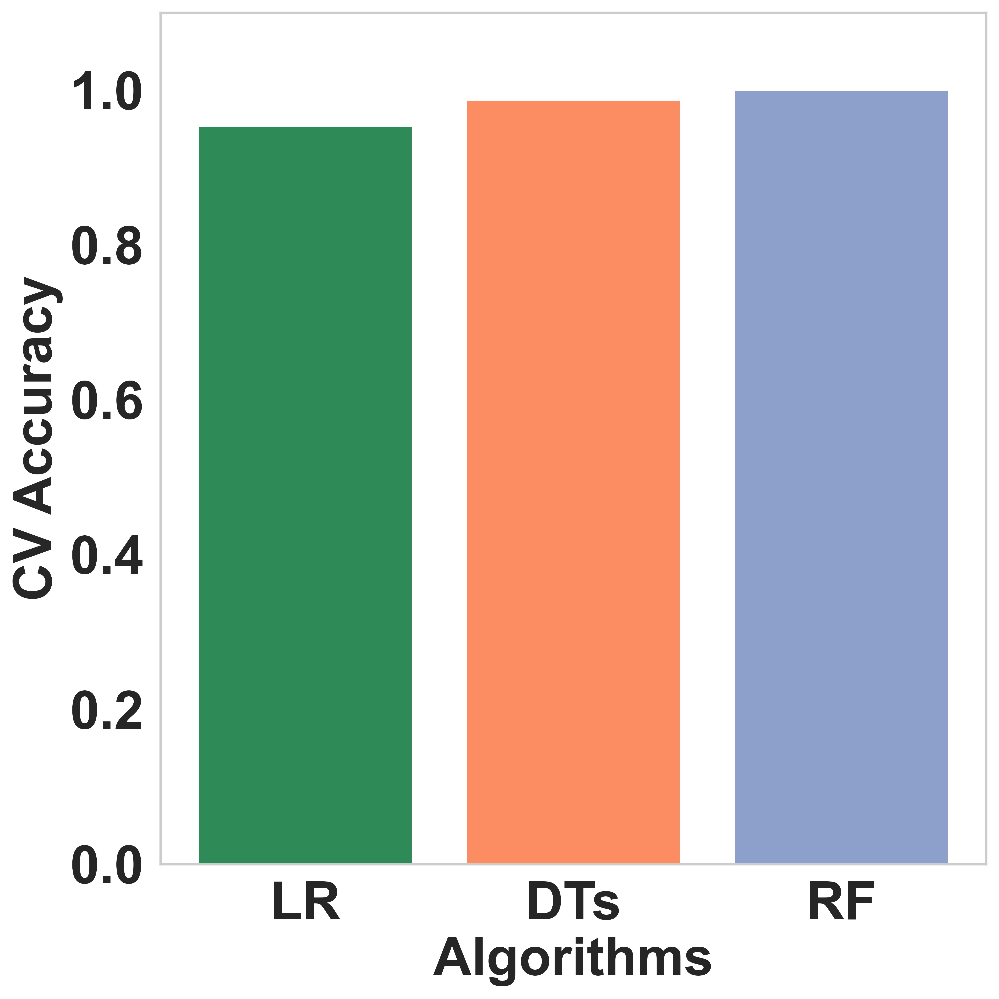

In [443]:
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define models and classifiers
models = ['LR', 'DTs', 'RF']
classifiers = [lr, clf3, rf]
colors = ['#2E8B57', '#fc8d62', '#8da0cb']

# Initialize metrics lists
accuracies = []
precisions = []
recalls = []
f1s = []
cv_means = []
cv_stds = []

# Use original dataset (not test split) for CV
x_class = df_classification.drop('D/I', axis=1)
y_class = df_classification['D/I']

# Evaluate each classifier
for clf in classifiers:
    y_pred = clf.predict(x_test)

    # Test set metrics
    accuracies.append(accuracy_score(y_test, y_pred))
    precisions.append(precision_score(y_test, y_pred, average='weighted'))
    recalls.append(recall_score(y_test, y_pred, average='weighted'))
    f1s.append(f1_score(y_test, y_pred, average='weighted'))

    # Cross-validation metrics
    cv_scores = cross_val_score(clf, x_class, y_class, cv=10)
    cv_means.append(cv_scores.mean())
    cv_stds.append(cv_scores.std())

# Format CV summary as text for CSV only
cv_summary = [f"{mean:.2f}±{std:.2f}" for mean, std in zip(cv_means, cv_stds)]

# Save to CSV
results_df = pd.DataFrame({
    'Algorithms': models,
    'Accuracy': accuracies,
    'Precision': precisions,
    'Recall': recalls,
    'F1-Score': f1s,
    'CV Score (Mean±Std)': cv_summary
})
results_df.to_csv('model_performance_summary.csv', index=False)

# Plot only CV accuracy bars (no text on top)
plt.figure(figsize=(8, 8))
plt.bar(np.arange(len(models)), cv_means, color=colors)
plt.xticks(np.arange(len(models)), models, fontfamily='Arial', fontsize=30, fontweight='bold')
plt.yticks(fontfamily='Arial', fontsize=30, fontweight='bold')
plt.ylabel('CV Accuracy', fontfamily='Arial', fontsize=30, fontweight='bold')
plt.xlabel('Algorithms', fontfamily='Arial', fontsize=30, fontweight='bold')
plt.ylim(0, 1.1)
plt.tight_layout()
plt.grid(False)
plt.savefig('cross_validation_model1.png', dpi=600, format='png')
plt.show()

In [444]:
c=metrics.confusion_matrix(y_pred,y_test)
c_2=metrics.confusion_matrix(y_pred2,y_test)
c_3=metrics.confusion_matrix(y_pred3,y_test)

In [445]:
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = c, display_labels = [0, 1])
cm_display1 = metrics.ConfusionMatrixDisplay(confusion_matrix = c_2, display_labels = [0, 1])
cm_display2 = metrics.ConfusionMatrixDisplay(confusion_matrix = c_3, display_labels = [0, 1])

<Figure size 4800x4800 with 0 Axes>

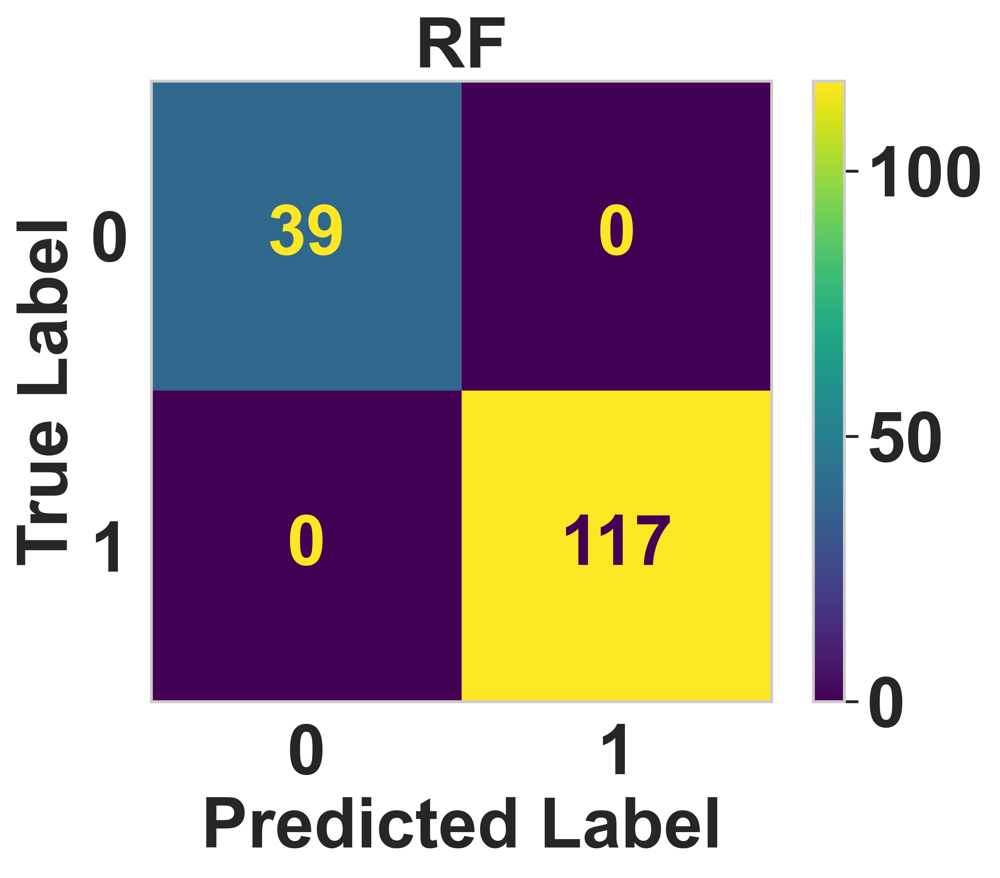

In [446]:
# Assuming `c` is already defined
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix=c, display_labels=[0, 1])

plt.figure(figsize=(8, 8))
fig, ax = plt.subplots()
cm_display.plot(cmap='viridis', ax=ax, values_format='d', colorbar=True)

# Apply Arial font
plt.xlabel('Predicted Label', fontname='Arial', fontsize=30, fontweight='bold')
plt.ylabel('True Label', fontname='Arial', fontsize=30, fontweight='bold')
plt.title('RF', fontname='Arial', fontsize=30, fontweight='bold')

# Modify tick labels
plt.xticks(fontname='Arial', fontsize=30, fontweight='bold')
plt.yticks(fontname='Arial', fontsize=30, fontweight='bold')

# Modify color bar
cbar = ax.images[0].colorbar
cbar.ax.yaxis.set_tick_params(labelsize=30)
for label in cbar.ax.get_yticklabels():
    label.set_fontname("Arial")
    label.set_fontsize(30)
    label.set_fontweight('bold')

# Modify inside text (confusion matrix values)
for text in ax.texts:
    text.set_fontname("Arial")
    text.set_fontsize(30)
    text.set_fontweight('bold')

plt.grid(False)
plt.savefig('rfcm_model1.png', dpi=600, format='png')
plt.show()

<Figure size 4800x4800 with 0 Axes>

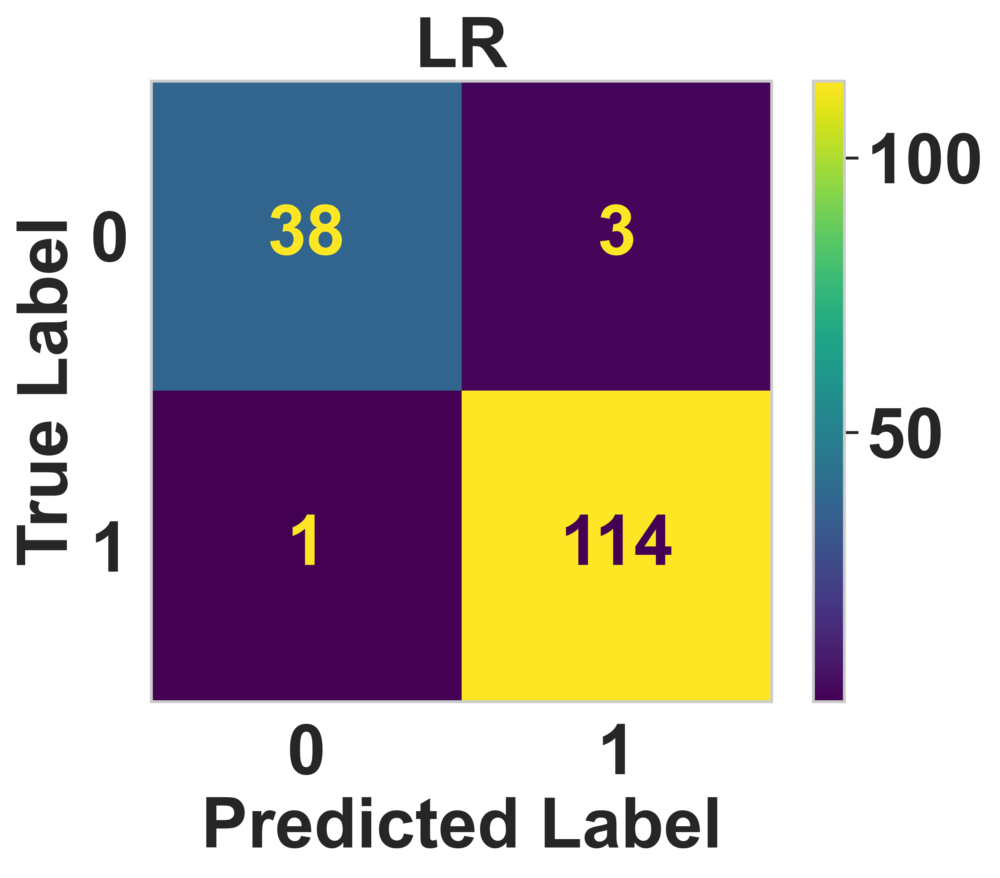

In [447]:
# Assuming `c_2` is already defined
cm_display1 = metrics.ConfusionMatrixDisplay(confusion_matrix=c_2, display_labels=[0, 1])

plt.figure(figsize=(8, 8))
fig, ax = plt.subplots()
cm_display1.plot(cmap='viridis', ax=ax, values_format='d', colorbar=True)

# Apply Arial font
plt.xlabel('Predicted Label', fontname='Arial', fontsize=30, fontweight='bold')
plt.ylabel('True Label', fontname='Arial', fontsize=30, fontweight='bold')
plt.title('LR', fontname='Arial', fontsize=30, fontweight='bold')

# Modify tick labels
plt.xticks(fontname='Arial', fontsize=30, fontweight='bold')
plt.yticks(fontname='Arial', fontsize=30, fontweight='bold')

# Modify color bar
cbar = ax.images[0].colorbar
cbar.ax.yaxis.set_tick_params(labelsize=30)
for label in cbar.ax.get_yticklabels():
    label.set_fontname("Arial")
    label.set_fontsize(30)
    label.set_fontweight('bold')

# Modify inside text (confusion matrix values)
for text in ax.texts:
    text.set_fontname("Arial")
    text.set_fontsize(30)
    text.set_fontweight('bold')

plt.grid(False)
plt.savefig('lrcm_model1.png', dpi=600, format='png')
plt.show()

<Figure size 4800x4800 with 0 Axes>

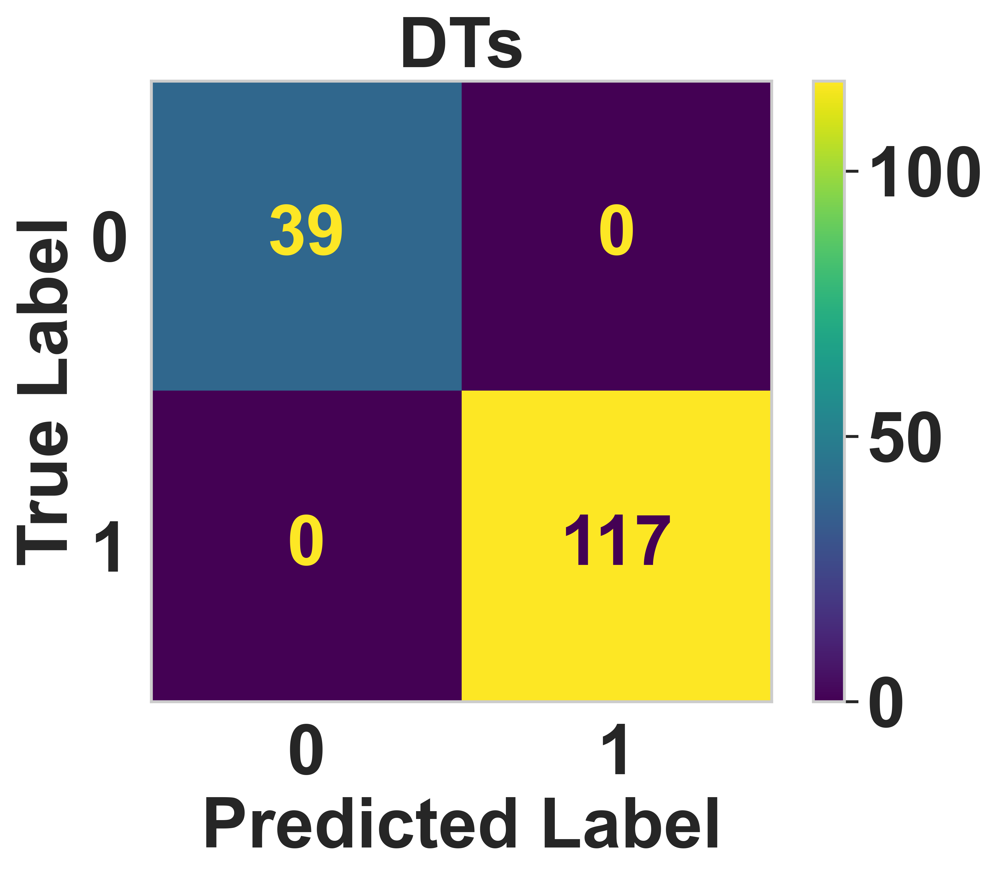

In [448]:
# Assuming `c_3` is already defined
cm_display2 = metrics.ConfusionMatrixDisplay(confusion_matrix=c_3, display_labels=[0, 1])

plt.figure(figsize=(8, 8))
fig, ax = plt.subplots()
cm_display2.plot(cmap='viridis', ax=ax, values_format='d', colorbar=True)

# Apply Arial font
plt.xlabel('Predicted Label', fontname='Arial', fontsize=30, fontweight='bold')
plt.ylabel('True Label', fontname='Arial', fontsize=30, fontweight='bold')
plt.title('DTs', fontname='Arial', fontsize=30, fontweight='bold')

# Modify tick labels
plt.xticks(fontname='Arial', fontsize=30, fontweight='bold')
plt.yticks(fontname='Arial', fontsize=30, fontweight='bold')

# Modify color bar
cbar = ax.images[0].colorbar
cbar.ax.yaxis.set_tick_params(labelsize=30)
for label in cbar.ax.get_yticklabels():
    label.set_fontname("Arial")
    label.set_fontsize(30)
    label.set_fontweight('bold')

# Modify inside text (confusion matrix values)
for text in ax.texts:
    text.set_fontname("Arial")
    text.set_fontsize(30)
    text.set_fontweight('bold')

plt.grid(False)
plt.savefig('dts_model1.png', dpi=600, format='png')
plt.show()

In [449]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc

In [450]:
y_pred_proba = lr.predict_proba(x_test)
y_pred_proba2=rf.predict_proba(x_test)[:,1] 
y_pred_proba3=clf3.predict_proba(x_test)[:,1]

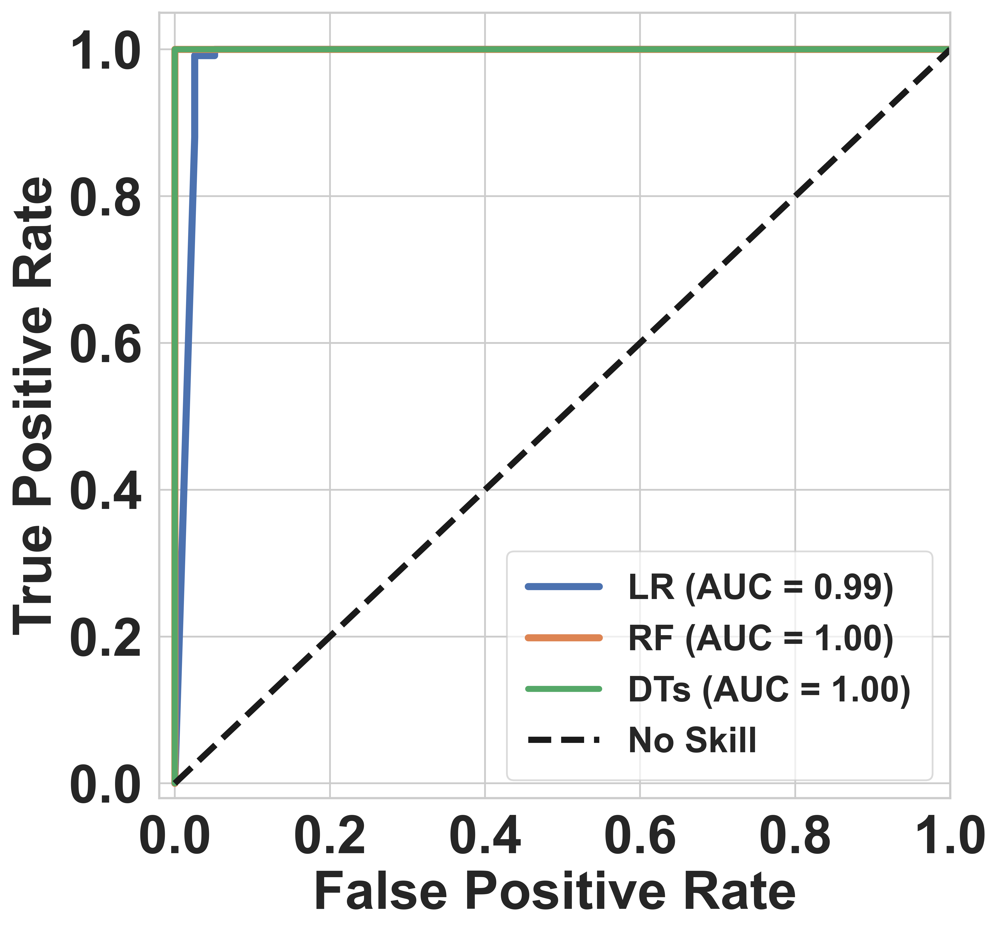

In [451]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(8, 8))  # Adjust figure size

# Plot ROC curve for Logistic Regression
fpr, tpr, _ = roc_curve(y_test, y_pred_proba[:, 1])
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label='LR (AUC = %0.2f)' % roc_auc, linewidth=4.0)

# Plot ROC curve for Random Forest (Thicker line for visibility)
fpr, tpr, _ = roc_curve(y_test, y_pred_proba2)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label='RF (AUC = %0.2f)' % roc_auc, linewidth=4.0)

# Plot ROC curve for Decision Tree
fpr, tpr, _ = roc_curve(y_test, y_pred_proba3)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label='DTs (AUC = %0.2f)' % roc_auc, linewidth=3.4)

# Plot No Skill line
plt.plot([0, 1], [0, 1], 'k--', label='No Skill', linewidth=3.5)

# Formatting
plt.xlim(-0.02, 1.0)  # start a little bit below 0
plt.ylim(-0.02, 1.05) # ditto on the y‑axis
plt.xlabel('False Positive Rate', fontname='Arial', fontsize=30, fontweight='bold')
plt.ylabel('True Positive Rate', fontname='Arial', fontsize=30, fontweight='bold')

# Modify tick labels
plt.xticks(fontname='Arial', fontsize=30, fontweight='bold')
plt.yticks(fontname='Arial', fontsize=30, fontweight='bold')

plt.legend(loc='lower right', frameon=True, fancybox=True, framealpha=0.7, borderpad=0.6, prop={'family': 'Arial', 'weight': 'bold','size': '20'})
plt.grid(True)
plt.savefig('aucroc_model1.png', dpi=600, format='png')
plt.show()


In [452]:
y_true = np.array([0, 0, 1, 1, 0, 1, 0, 1])
y_score = np.array([0.1, 0.4, 0.35, 0.8, 0.2, 0.9, 0.5, 0.7])

In [453]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import pandas as pd
# import numpy as np

# # Use the same feature matrix used to train rf
# feature_names = x_class.columns
# feature_importances = rf.feature_importances_

# # Create a dataframe for feature importances
# importance_df = pd.DataFrame({
#     'Feature': feature_names,
#     'Importance': feature_importances
# }).sort_values(by='Importance', ascending=False)

# # Select the top 10 descriptors
# top_45_descriptors = importance_df.head(45)

# # Compute Mean ± Std Dev for Decoys and Inhibitors
# detailed_stats = []
# for feature in top_45_descriptors['Feature']:
#     row = {'Descriptor': feature}
#     for di in sorted(df_final['D/I'].unique()):
#         values = df_final[df_final['D/I'] == di][feature]
#         mean = round(values.mean(), 2)
#         std = round(values.std(), 2)
#         label = "Decoy" if di == 0 else "Inhibitor"
#         row[f'{label} (Mean±SD)'] = f"{mean} ± {std}"
#     detailed_stats.append(row)

# # Create and save summary DataFrame
# descriptor_summary_df = pd.DataFrame(detailed_stats)
# descriptor_summary_df.to_csv('descriptor_mean_std_only.csv', index=False)
# print(descriptor_summary_df)

# # Plot violin plots for each descriptor
# for feature in top_45_descriptors['Feature']:
#     plt.figure(figsize=(8, 8), dpi=600)
#     sns.violinplot(x='D/I', y=feature, data=df_final, palette="rocket")

#     plt.ylabel(feature, fontsize=30, fontweight='bold', color='black', family='Arial')
#     plt.xticks([0, 1], ['Decoy', 'Inhibitor'], fontsize=30, fontweight='bold')
#     plt.yticks(fontsize=30, fontweight='bold', color='black', family='Arial')
#     plt.tick_params(axis='both', which='major', labelsize=30, width=1.5)

#     plt.legend([], [], frameon=False)
#     plt.tight_layout()
#     plt.grid(False)
#     plt.savefig(f"violin_plot_model1_{feature}.png", dpi=600, format='png')
#     plt.show()

In [454]:
df_classification

,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,nB,nN,nO,nS,...,P2s,E1s,E2s,E3s,Ts,As,Vs,Ks,Ds,D/I
0,0.0,3.2110,10.310000,73.1300,37.130000,9.0,0.0,3.0,0.0,2.0,...,0.178300,0.486200,0.427400,0.395600,13.010000,29.940000,54.890000,0.674300,1.309000,0
1,0.0,3.8210,14.600000,77.0100,39.510000,16.0,0.0,3.0,0.0,1.0,...,0.193400,0.482000,0.455800,0.372700,14.710000,42.420000,81.830000,0.629900,1.311000,0
2,0.0,3.8800,15.060000,65.4700,33.390000,11.0,0.0,2.0,1.0,0.0,...,0.189100,0.504400,0.501500,0.424600,10.120000,24.180000,50.530000,0.536600,1.430000,0
3,0.0,3.8710,14.990000,74.5800,40.790000,11.0,0.0,3.0,0.0,0.0,...,0.242300,0.504700,0.431900,0.231400,13.860000,41.420000,75.940000,0.569100,1.168000,0
4,0.0,3.9570,15.650000,77.1700,44.130000,12.0,0.0,3.0,0.0,0.0,...,0.183000,0.551500,0.485100,0.342000,17.230000,51.620000,91.680000,0.679000,1.379000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,0.0,-0.2353,0.055366,42.5026,63.380618,18.0,0.0,2.0,2.0,0.0,...,0.179223,0.555734,0.436032,0.416475,25.082819,104.722507,228.173732,0.650642,1.408241,1
580,0.0,0.0343,0.001176,49.4782,67.438997,18.0,0.0,3.0,1.0,0.0,...,0.122371,0.542853,0.425386,0.409096,31.015638,120.321795,242.167770,0.766816,1.377335,1
581,0.0,-2.2591,5.103533,17.2235,37.879930,12.0,0.0,0.0,6.0,0.0,...,0.201804,0.576931,0.436802,0.419852,13.893438,44.930991,97.623484,0.542578,1.433585,1
582,0.0,-2.2591,5.103533,17.2235,37.879930,12.0,0.0,0.0,6.0,0.0,...,0.202802,0.561348,0.511168,0.348289,14.810341,43.607131,82.880638,0.621288,1.420805,1


In [455]:
df_final['D/I'].value_counts

<bound method IndexOpsMixin.value_counts of 0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
1275    0.0
1276    0.0
1277    0.0
1278    0.0
1279    0.0
Name: D/I, Length: 1280, dtype: float64>

In [456]:
df_final['D/I']

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
1275    0.0
1276    0.0
1277    0.0
1278    0.0
1279    0.0
Name: D/I, Length: 1280, dtype: float64

In [457]:
df_final=pd.read_csv('data_for_validation.csv')

In [458]:
df_final=df_final.iloc[:,1:]

In [459]:
df_final.drop(['Class','IC50'],axis=1,inplace=True)

In [460]:
df_bana_lo=pd.DataFrame(columns=df_classification_final.columns)

In [461]:
df_final1=pd.concat([df_bana_lo,df_final], axis=0)

In [462]:
df_final1

,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,nB,nN,nO,nS,...,SpMin7_Bhi,SpMin8_Bhi,SpMax6_Bhs,SpMax8_Bhs,SpMin3_Bhs,SpMin4_Bhs,SpMin5_Bhs,SpMin6_Bhs,SpMin7_Bhs,SpMin8_Bhs
0,0.0,-0.26335,0.636014,48.48790,58.728963,15.0,0.0,2.0,3.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,-1.13710,1.342586,40.92730,54.937463,16.0,0.0,3.0,3.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,-0.91285,1.347224,42.35185,58.311653,16.0,0.0,2.0,3.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [463]:
df_final_imp = imputer.transform(df_final1)

In [464]:
df_final_imp = pd.DataFrame(df_final_imp, columns=df_final1.columns)

In [465]:
df_final_imp.drop('D/I', axis=1,inplace=True)

In [466]:
print(lr.feature_names_in_)
print(df_final_imp.columns.difference(lr.feature_names_in_))


['nAcid' 'ALogP' 'ALogp2' ... 'Vs' 'Ks' 'Ds']
Index(['AATS1e', 'AATS1v', 'AATS2e', 'AATS2m', 'AATS2v', 'AATSC0e', 'AATSC1e',
       'AATSC1p', 'AATSC1s', 'AATSC2c',
       ...
       'nAromBond', 'nAtom', 'nBonds', 'nBonds2', 'nBondsD2', 'nBondsS',
       'nBondsS2', 'nC', 'nH', 'nHeavyAtom'],
      dtype='object', length=241)


In [467]:
df_final_imp_aligned = df_final_imp[lr.feature_names_in_]
lr.predict(df_final_imp_aligned)

array([1, 1, 1])

In [468]:
df_importances=pd.DataFrame({'Feature_name':rf.feature_names_in_, "Importances": rf.feature_importances_}).sort_values('Importances',ascending=False)

In [469]:
df_classification_final['D/I'].value_counts()

D/I
0    696
1    584
Name: count, dtype: int64

In [470]:
print(df_importances.head())

     Feature_name  Importances
1395       RDF20v     0.051192
321    SpMin2_Bhv     0.050888
1476      RDF125p     0.036597
1425       RDF20e     0.034317
293      BCUTw-1l     0.033767


1 features → Accuracy: 0.9782
2 features → Accuracy: 0.9910
3 features → Accuracy: 0.9974
4 features → Accuracy: 0.9974
5 features → Accuracy: 0.9974
6 features → Accuracy: 0.9987
7 features → Accuracy: 0.9962
8 features → Accuracy: 0.9987
9 features → Accuracy: 0.9987
10 features → Accuracy: 0.9987
11 features → Accuracy: 0.9987
12 features → Accuracy: 0.9987
13 features → Accuracy: 0.9987
14 features → Accuracy: 0.9987
15 features → Accuracy: 0.9987
16 features → Accuracy: 0.9974
17 features → Accuracy: 0.9987
18 features → Accuracy: 0.9974
19 features → Accuracy: 0.9987
20 features → Accuracy: 0.9987
21 features → Accuracy: 0.9987
22 features → Accuracy: 0.9987
23 features → Accuracy: 0.9987
24 features → Accuracy: 0.9987
25 features → Accuracy: 0.9987
26 features → Accuracy: 1.0000
27 features → Accuracy: 1.0000
28 features → Accuracy: 1.0000
29 features → Accuracy: 1.0000
30 features → Accuracy: 1.0000
31 features → Accuracy: 1.0000
32 features → Accuracy: 1.0000
33 features → Acc

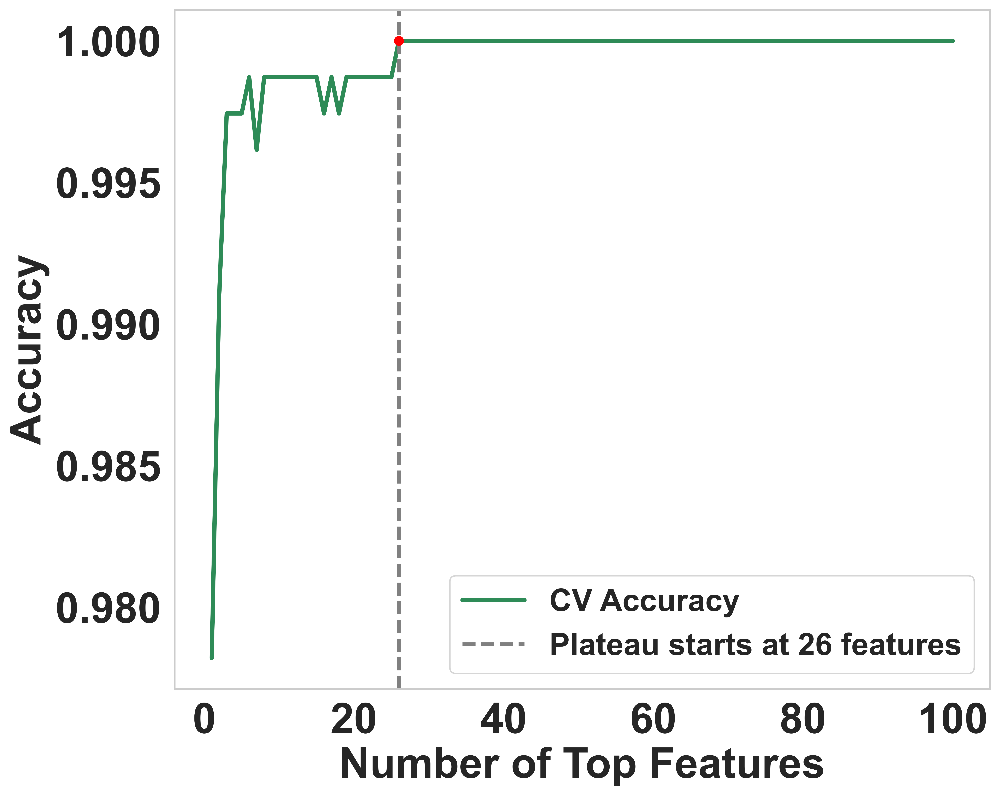

In [471]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
from tqdm import tqdm
import warnings

# Setup
warnings.filterwarnings('ignore')
sns.set(style="whitegrid")
np.random.seed(42)

def rf_feature_selection_cv_plot(x, y):
    accuracies = []

    # Initial RF to get importances
    rf_model_initial = RandomForestClassifier(random_state=42, n_estimators=100, n_jobs=-1)
    rf_model_initial.fit(x, y)

    importances = rf_model_initial.feature_importances_
    feature_names = x.columns
    df_importances = pd.DataFrame({'Feature_name': feature_names, 'Importances': importances})

    # Sort features by importance descending
    sorted_features = df_importances.sort_values('Importances', ascending=False)['Feature_name'].tolist()

    # Stratified CV
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    rf_model = RandomForestClassifier(random_state=42, n_estimators=100, n_jobs=-1)

    # Accuracy with top-N features
    for i in range(1, min(101, len(sorted_features) + 1)):
        top_features = sorted_features[:i]
        x_subset = x[top_features]
        acc = np.mean(cross_val_score(rf_model, x_subset, y, cv=cv, scoring='accuracy'))
        accuracies.append(acc)
        print(f"{i} features → Accuracy: {acc:.4f}")

    # --- Improved plateau detection ---
    epsilon = 0.001  # tolerance
    max_acc = max(accuracies)
    for i in range(len(accuracies)):
        if all((max_acc - acc) < epsilon for acc in accuracies[i:]):
            plateau_start = i + 1  # 1-based indexing
            break
    else:
        plateau_start = None

    # --- Plot ---
    plt.figure(figsize=(10, 8))
    plt.plot(range(1, len(accuracies) + 1), accuracies, color='seagreen', label='CV Accuracy', linewidth=3)

    if plateau_start:
        plt.axvline(x=plateau_start, color='gray', linestyle='--', linewidth=2.5,
                    label=f'Plateau starts at {plateau_start} features')
        plt.scatter(plateau_start, accuracies[plateau_start - 1], color='red', zorder=5)

        # Save top plateau features
        top_plateau_features = sorted_features[:plateau_start]
        pd.Series(top_plateau_features).to_csv("top_features_model1.csv", index=False, header=False)
        print(f"Top {plateau_start} features saved to 'top_features_model1.csv'")
    else:
        print("No clear plateau detected.")

    # Plot formatting
    plt.xlabel('Number of Top Features', fontsize=30, fontweight='bold', family='Arial')
    plt.ylabel('Accuracy', fontsize=30, fontweight='bold', family='Arial')
    plt.xticks(fontsize=30, fontweight='bold', family='Arial')
    plt.yticks(fontsize=30, fontweight='bold', family='Arial')
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.legend(prop={'family': 'Arial', 'size': 22, 'weight': 'bold'})
    plt.tight_layout()
    plt.grid(False)
    plt.savefig('topfeatures_RF_CV_model1.png', dpi=600)
    plt.show()

# Run the function
rf_feature_selection_cv_plot(x_class, y)

In [472]:
import os
import pandas as pd
from sklearn.ensemble import RandomForestClassifier

def save_and_print_plateau_feature_importances(x, y, plateau_feature_count, output_csv="plateau_feature_importance.csv"):
    # Train model
    rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
    rf.fit(x, y)

    # Calculate importances
    importances = rf.feature_importances_
    feature_names = x.columns
    df_importance = pd.DataFrame({'Feature': feature_names, 'Raw_Importance': importances})

    # Sort by importance
    df_sorted = df_importance.sort_values(by='Raw_Importance', ascending=False)

    # Get top N features
    df_top = df_sorted.iloc[:plateau_feature_count].copy()

    # Normalize
    df_top['Normalized_Importance'] = df_top['Raw_Importance'] / df_top['Raw_Importance'].sum()

    # Print table
    print(f"\nTop {plateau_feature_count} Feature Importances:\n")
    print(df_top.to_string(index=False))

    # Save CSV
    try:
        full_path = os.path.join(os.getcwd(), output_csv)
        df_top.to_csv(full_path, index=False, encoding='utf-8')
        print(f"\n✅ CSV successfully saved to: {full_path}")
    except Exception as e:
        print(f"\n❌ Error saving CSV: {e}")

    return df_top


In [473]:
save_and_print_plateau_feature_importances(x_class, y, plateau_feature_count=25, output_csv="model1_top_importance_features.csv")


Top 25 Feature Importances:

   Feature  Raw_Importance  Normalized_Importance
    RDF20e        0.066523               0.118462
SpMin2_Bhm        0.033676               0.059970
SpMin2_Bhe        0.032413               0.057721
    WPSA-3        0.029899               0.053243
   RDF125i        0.027594               0.049140
   RDF120s        0.026910               0.047920
    RDF20i        0.026848               0.047811
     ALogP        0.025668               0.045710
    RDF20u        0.025228               0.044925
   RDF135u        0.025126               0.044744
    RDF20s        0.022953               0.040874
    RDF20v        0.021343               0.038008
   RDF135v        0.020354               0.036246
   RDF115s        0.017648               0.031428
  BCUTc-1h        0.016859               0.030022
   RDF125u        0.016352               0.029120
   RDF130m        0.014791               0.026339
   RDF130u        0.014456               0.025742
  BCUTw-1h        0.

,Feature,Raw_Importance,Normalized_Importance
1425,RDF20e,0.066523,0.118462
310,SpMin2_Bhm,0.033676,0.059970
322,SpMin2_Bhe,0.032413,0.057721
1300,WPSA-3,0.029899,0.053243
1506,RDF125i,0.027594,0.049140
1535,RDF120s,0.026910,0.047920
1485,RDF20i,0.026848,0.047811
1,ALogP,0.025668,0.045710
1335,RDF20u,0.025228,0.044925
1358,RDF135u,0.025126,0.044744


In [474]:
df_classification

,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,nB,nN,nO,nS,...,P2s,E1s,E2s,E3s,Ts,As,Vs,Ks,Ds,D/I
0,0.0,3.2110,10.310000,73.1300,37.130000,9.0,0.0,3.0,0.0,2.0,...,0.178300,0.486200,0.427400,0.395600,13.010000,29.940000,54.890000,0.674300,1.309000,0
1,0.0,3.8210,14.600000,77.0100,39.510000,16.0,0.0,3.0,0.0,1.0,...,0.193400,0.482000,0.455800,0.372700,14.710000,42.420000,81.830000,0.629900,1.311000,0
2,0.0,3.8800,15.060000,65.4700,33.390000,11.0,0.0,2.0,1.0,0.0,...,0.189100,0.504400,0.501500,0.424600,10.120000,24.180000,50.530000,0.536600,1.430000,0
3,0.0,3.8710,14.990000,74.5800,40.790000,11.0,0.0,3.0,0.0,0.0,...,0.242300,0.504700,0.431900,0.231400,13.860000,41.420000,75.940000,0.569100,1.168000,0
4,0.0,3.9570,15.650000,77.1700,44.130000,12.0,0.0,3.0,0.0,0.0,...,0.183000,0.551500,0.485100,0.342000,17.230000,51.620000,91.680000,0.679000,1.379000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,0.0,-0.2353,0.055366,42.5026,63.380618,18.0,0.0,2.0,2.0,0.0,...,0.179223,0.555734,0.436032,0.416475,25.082819,104.722507,228.173732,0.650642,1.408241,1
580,0.0,0.0343,0.001176,49.4782,67.438997,18.0,0.0,3.0,1.0,0.0,...,0.122371,0.542853,0.425386,0.409096,31.015638,120.321795,242.167770,0.766816,1.377335,1
581,0.0,-2.2591,5.103533,17.2235,37.879930,12.0,0.0,0.0,6.0,0.0,...,0.201804,0.576931,0.436802,0.419852,13.893438,44.930991,97.623484,0.542578,1.433585,1
582,0.0,-2.2591,5.103533,17.2235,37.879930,12.0,0.0,0.0,6.0,0.0,...,0.202802,0.561348,0.511168,0.348289,14.810341,43.607131,82.880638,0.621288,1.420805,1


In [475]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load data
df = df_classification.copy()  # assuming df_classification is already loaded
top_features = pd.read_csv("top_features_model1.csv", header=None)[0].tolist()

# Compute Mean ± Std Dev for Decoys and Inhibitors
stats = []
for feature in top_features:
    row = {'Descriptor': feature}
    for label, name in zip([0, 1], ['Decoy', 'Inhibitor']):
        values = df[df["D/I"] == label][feature]
        mean = round(values.mean(), 2)
        std = round(values.std(), 2)
        row[f'{name} (Mean±SD)'] = f"{mean} ± {std}"
    stats.append(row)

# Save to CSV
stats_df = pd.DataFrame(stats)
stats_df.to_csv("top_feature_values_RF.csv", index=False)

# Print preview
print(stats_df.head())

   Descriptor Decoy (Mean±SD) Inhibitor (Mean±SD)
0      RDF20e     2.75 ± 1.14        14.08 ± 6.18
1  SpMin2_Bhm     1.44 ± 0.57         1.94 ± 0.04
2  SpMin2_Bhe     1.39 ± 0.44         1.85 ± 0.04
3      WPSA-3     8.06 ± 2.24          19.8 ± 6.3
4     RDF125i       0.0 ± 0.0         8.04 ± 7.53


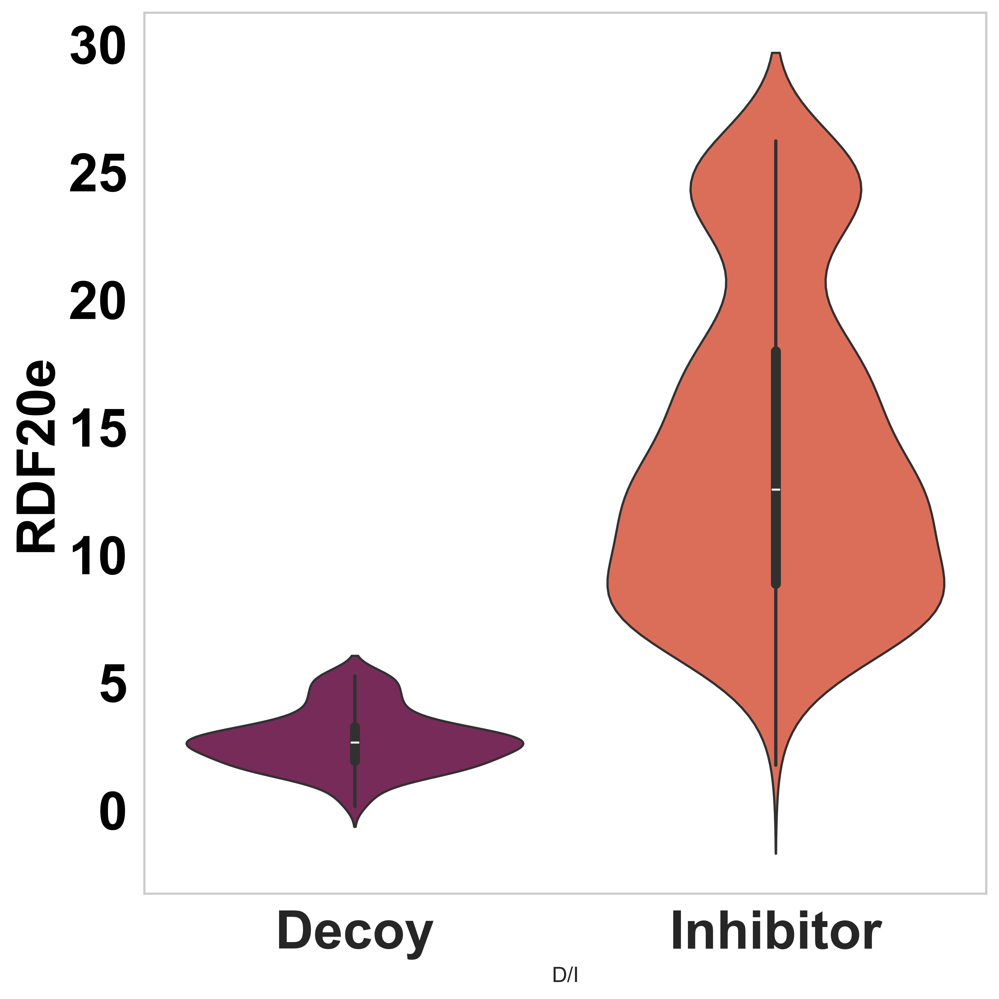

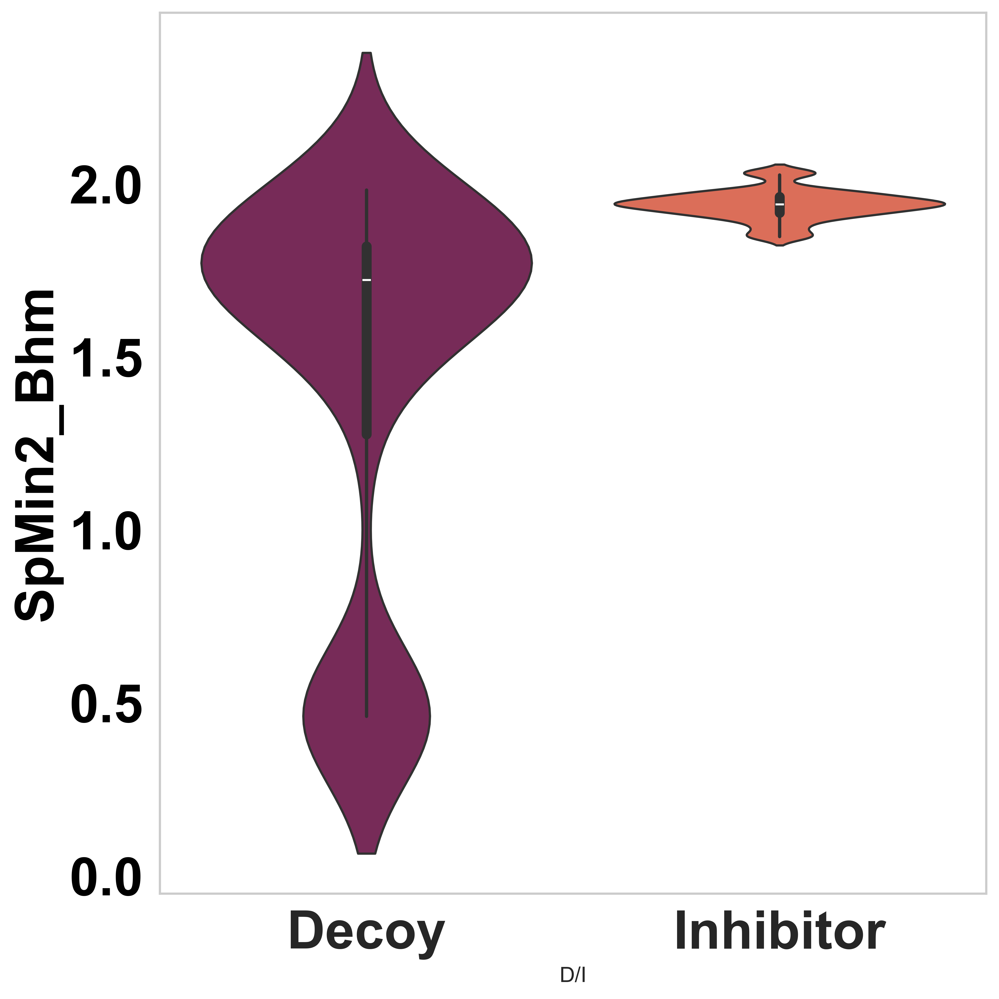

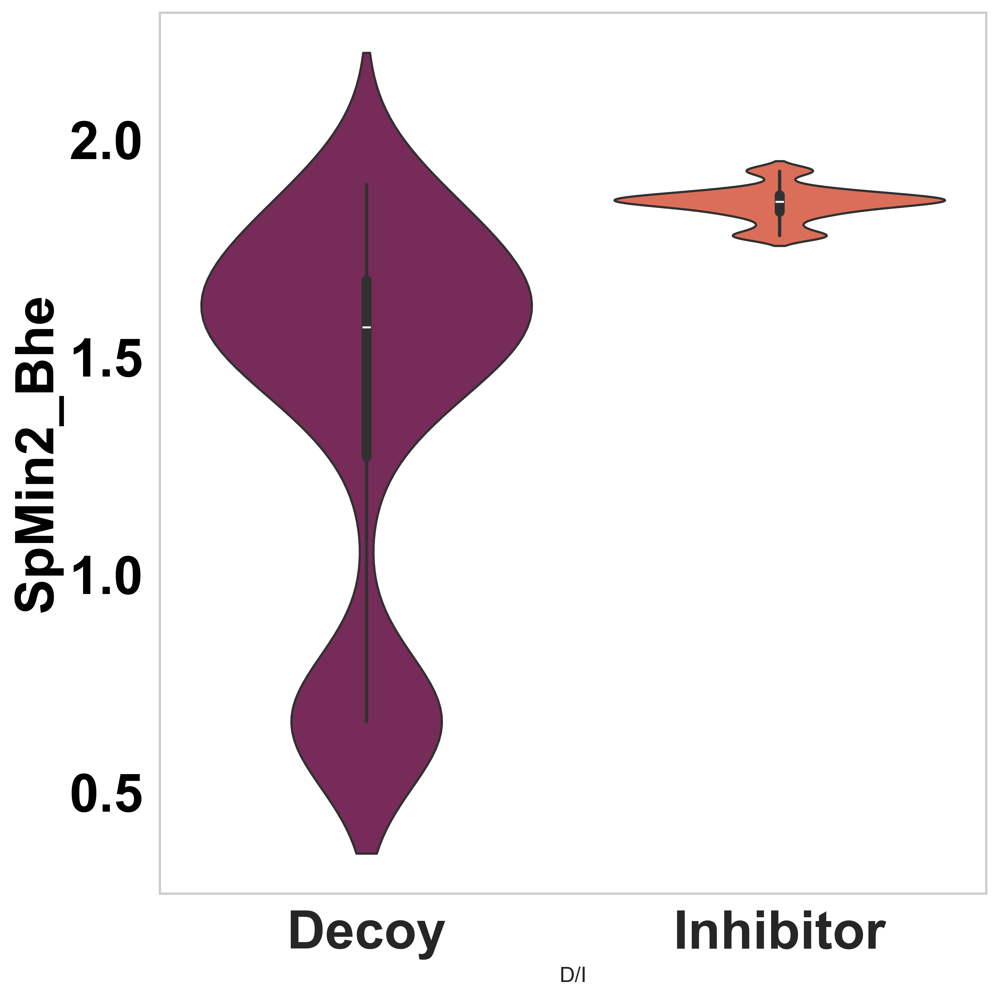

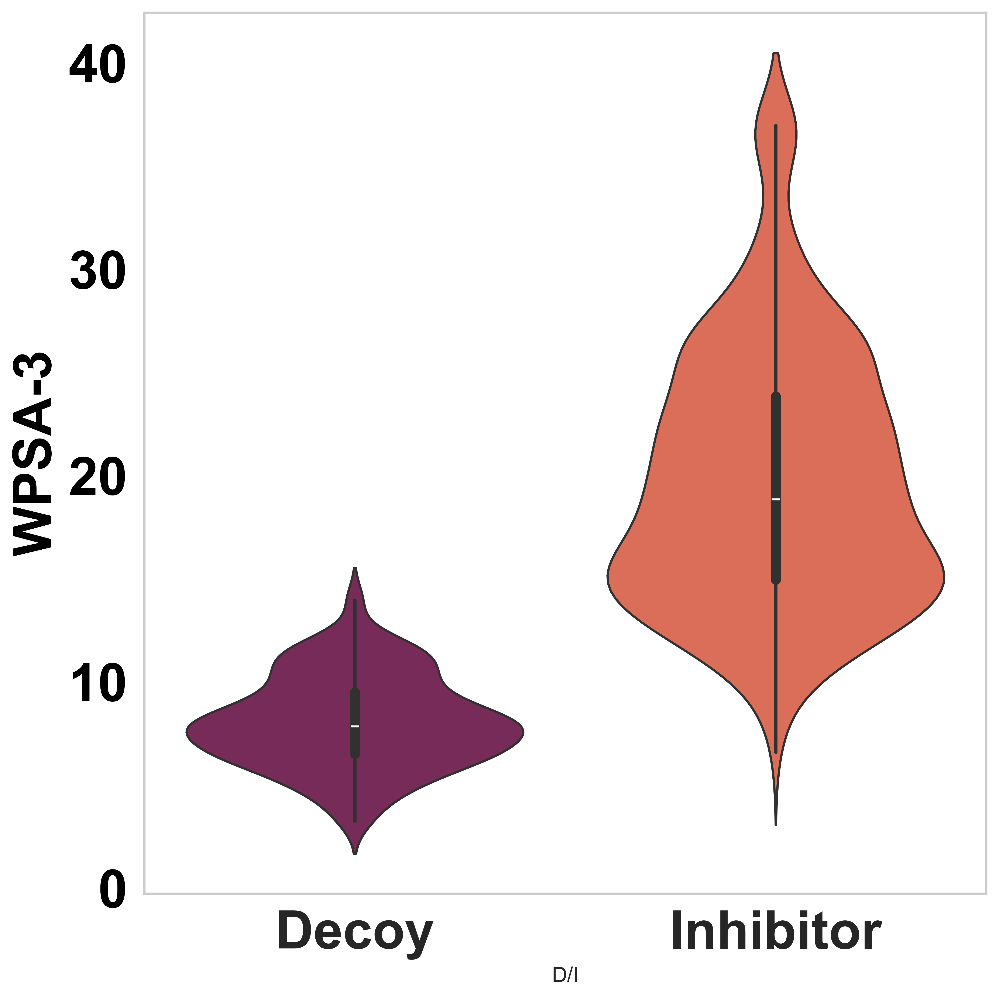

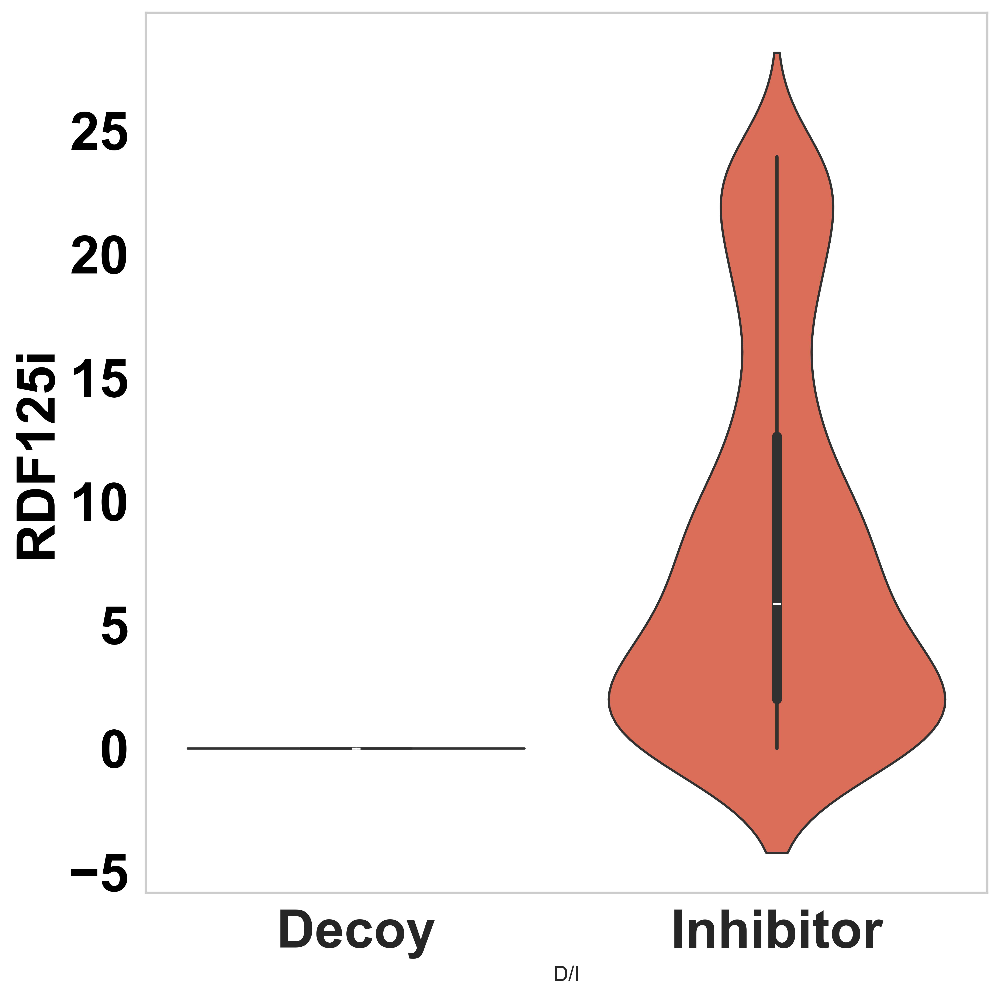

...

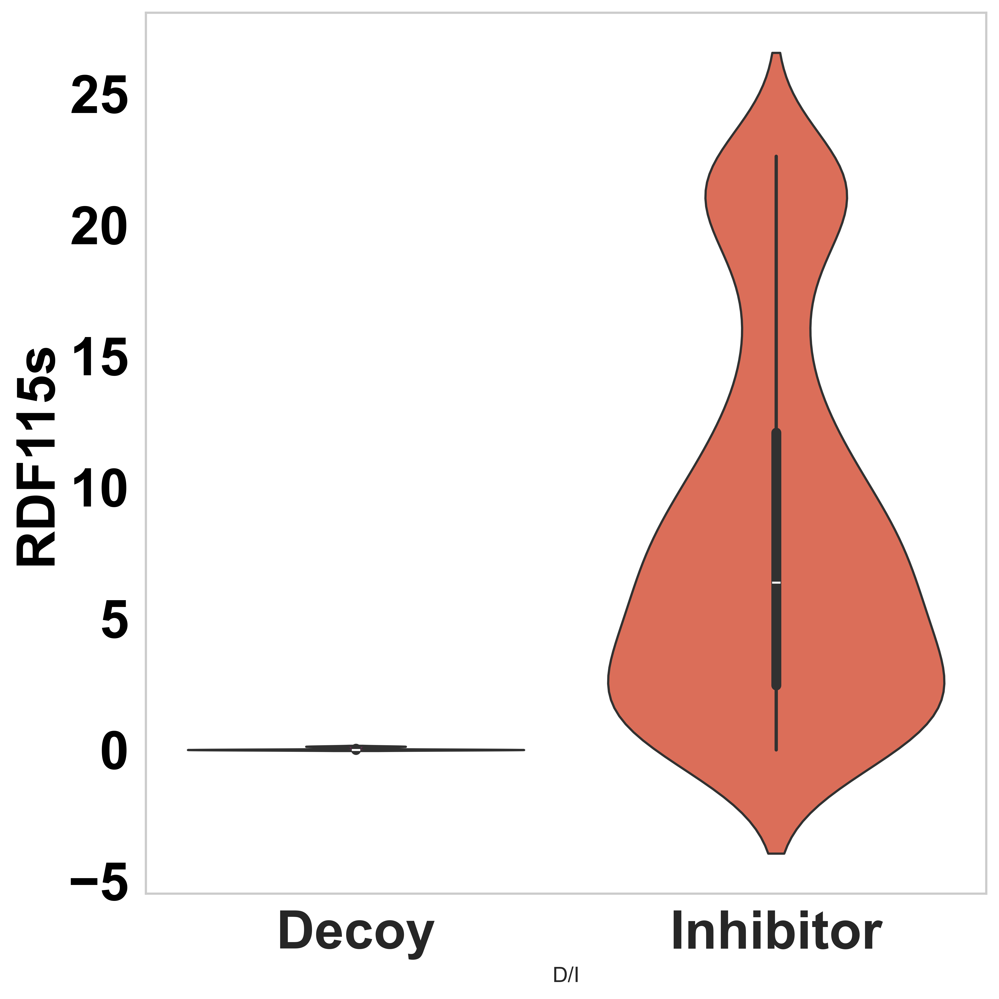

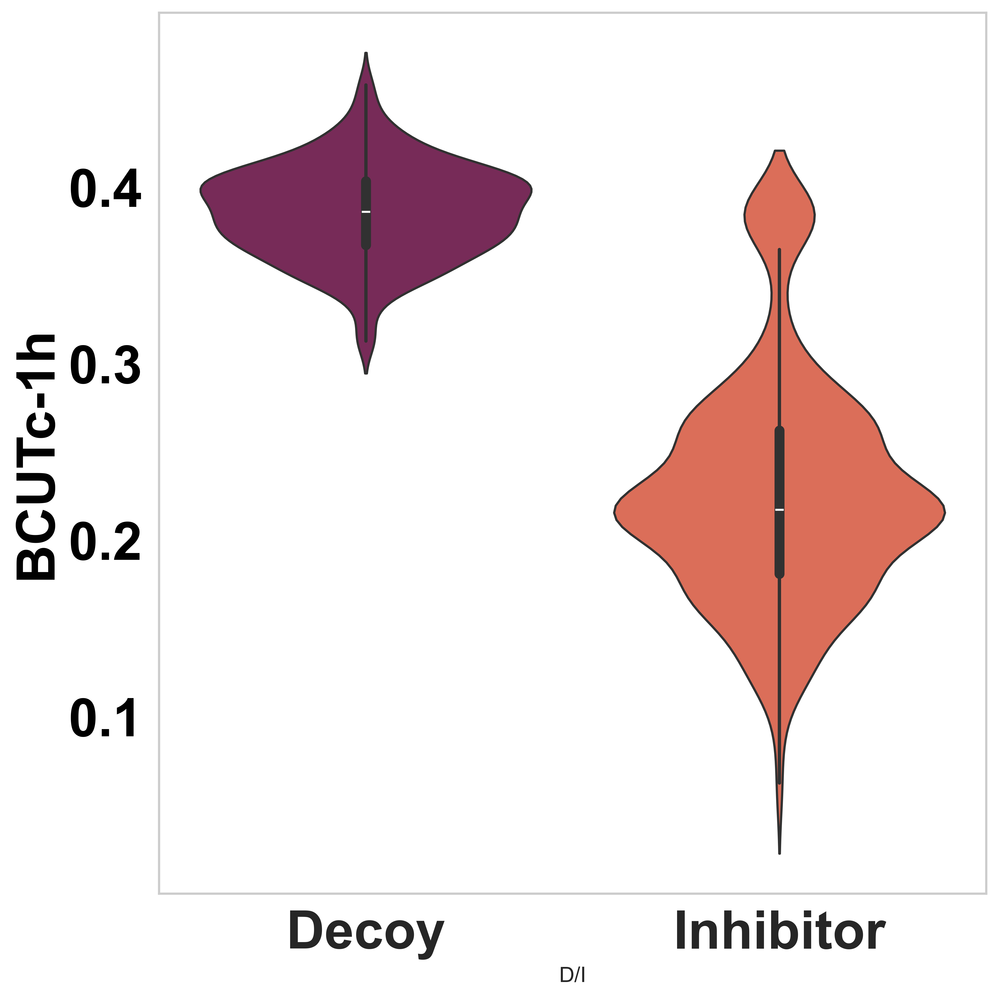

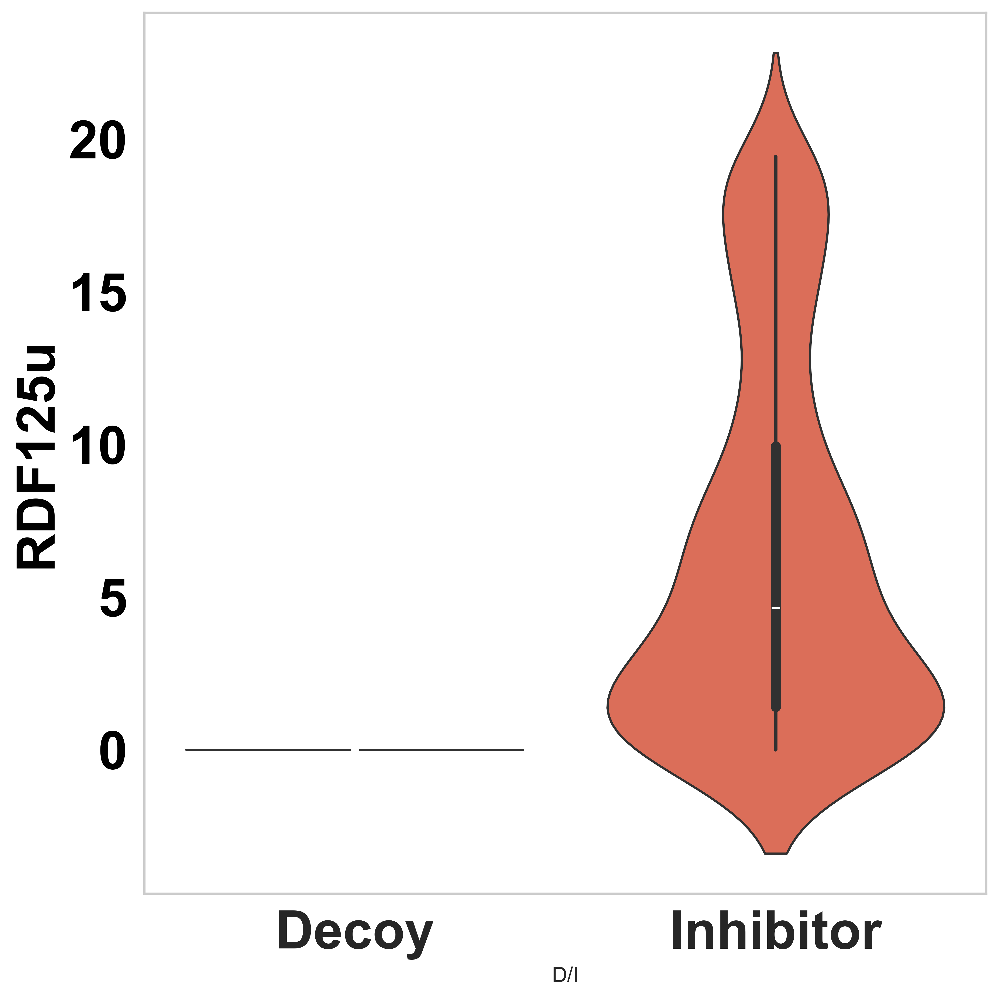

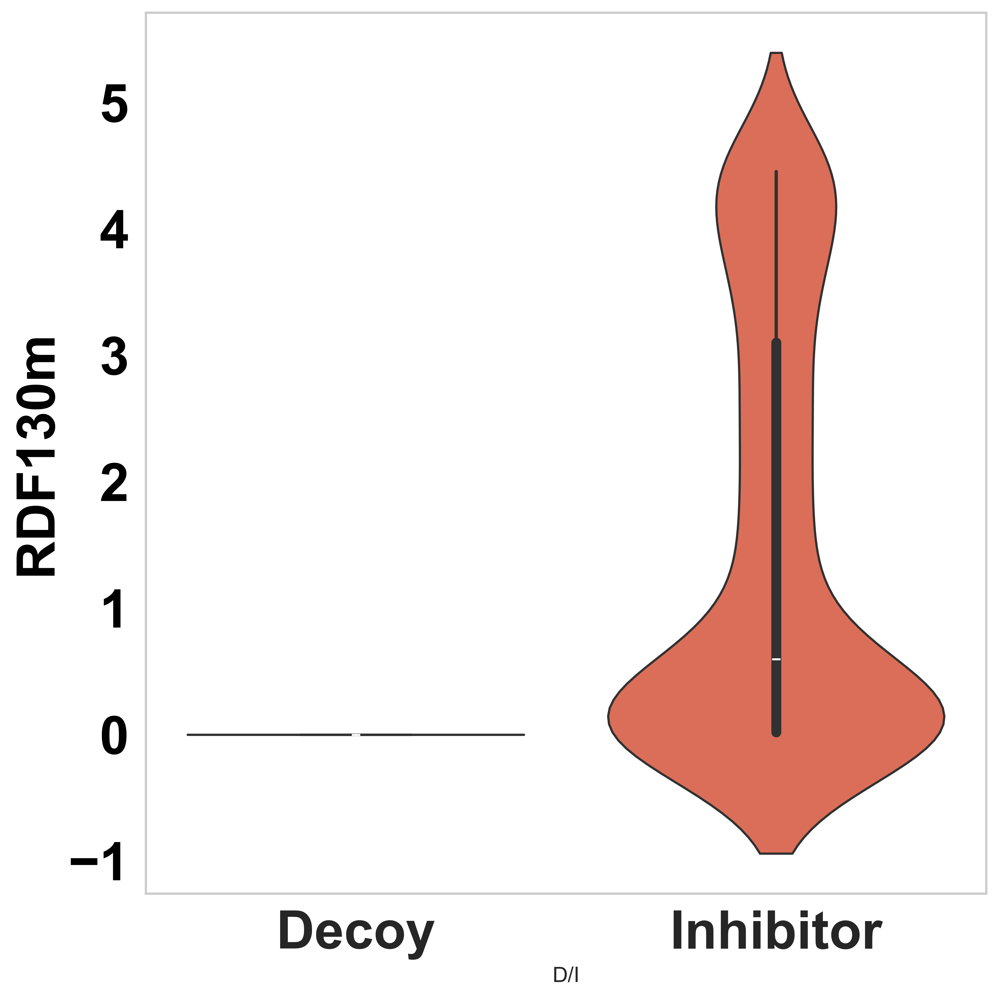

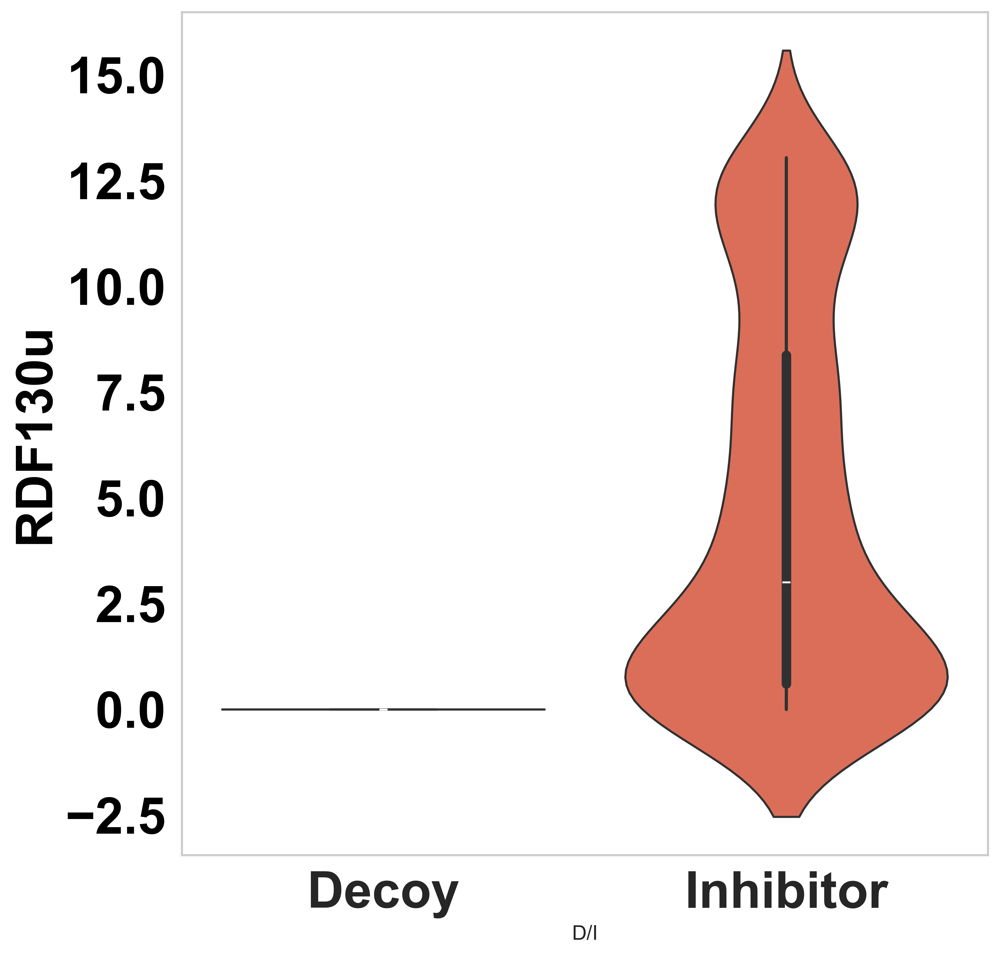

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for feature in top_features:
    plt.figure(figsize=(8, 8))
    sns.violinplot(data=df, x='D/I', y=feature, palette='rocket')
    
    plt.ylabel(feature, fontsize=30, fontweight='bold', color='black', family='Arial')
    plt.xticks([0, 1], ['Decoy', 'Inhibitor'], fontsize=30, fontweight='bold')
    plt.yticks(fontsize=18, fontweight='bold', color='black', family='Arial')
    plt.tick_params(axis='both', which='major', labelsize=30, width=1.5)
    
    plt.legend([], [], frameon=False)  # no legend
    plt.tight_layout()
    plt.grid(False)
    
    plt.savefig(f"violin_plot_model1new_{feature}.png", dpi=600, format='png')
    plt.show()

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

def mannwhitney_test_top_features(x, y, top_features):
    # Ensure x is a DataFrame with columns matching top_features
    if not isinstance(x, pd.DataFrame):
        raise ValueError("x must be a pandas DataFrame.")
    
    if x.shape[0] != len(y):
        raise ValueError(f"Number of samples in x ({x.shape[0]}) does not match length of y ({len(y)}).")

    results = []
    group0 = x[y == 0]
    group1 = x[y == 1]

    for feature in top_features:
        try:
            stat, p_value = mannwhitneyu(group0[feature], group1[feature], alternative='two-sided')
            results.append((feature, stat, p_value))
        except Exception as e:
            print(f"Error processing feature '{feature}': {e}")
            results.append((feature, np.nan, np.nan))

    df_results = pd.DataFrame(results, columns=["Feature", "U_statistic", "P_value"])
    df_results["Adjusted_P"] = multipletests(df_results["P_value"], method='fdr_bh')[1]
    df_results["Significant"] = df_results["Adjusted_P"] < 0.05

    return df_results.sort_values("Adjusted_P")

# Load top features saved by your RF plot function
top_features = pd.read_csv("top_features_model1.csv", header=None)[0].tolist()

# Make sure your features matrix and labels are prepared:
# x_class = pd.DataFrame(...)  # Your feature dataframe
# y = np.array(...)            # Your labels (0/1)

# Run Mann-Whitney U test on these top features
result_df = mannwhitney_test_top_features(x_class, y, top_features)

# Save results and display
result_df.to_csv("mannwhitney_results_top_features_model1.csv", index=False)
print(result_df)

In [ ]:
df=pd.read_csv('data_for_validation.csv')

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.lines import Line2D

plt.rcParams.update({
    'font.family': 'Arial',
    'figure.dpi': 600
})

dot_colors = {'Decoy': '#ADFF2F', 'Inhibitor': '#FF1493'}  # LimeGreen & DeepPink
std_colors = {'Decoy': '#00BFAE', 'Inhibitor': '#FFB6C1'}  # Light Teal & Light Pink

top_5_descriptors = importance_df.iloc[0:8]['Feature']
mean_values = df_classification_final.groupby('D/I')[top_5_descriptors].mean()
std_values = df_classification_final.groupby('D/I')[top_5_descriptors].std()

for descriptor in top_5_descriptors:
    decoy_mean = mean_values.loc[0, descriptor]
    inhibitor_mean = mean_values.loc[1, descriptor]
    decoy_std = std_values.loc[0, descriptor]
    inhibitor_std = std_values.loc[1, descriptor]

    decoy_vals = df_classification_final[df_classification_final['D/I'] == 0][descriptor].sample(3, random_state=42).values
    inhib_vals = df_classification_final[df_classification_final['D/I'] == 1][descriptor].sample(3, random_state=42).values

    fig, ax = plt.subplots(figsize=(8.5, 7))

    # Mean lines
    ax.plot([-0.4, 0.4], [decoy_mean, decoy_mean], color='black', linewidth=2)
    ax.plot([0.6, 1.4], [inhibitor_mean, inhibitor_mean], color='black', linewidth=2)

    # SD boxes
    ax.add_patch(plt.Rectangle(
        (0 - 0.4, decoy_mean - decoy_std), 0.8, 2 * decoy_std,
        color=std_colors['Decoy'], alpha=0.5
    ))
    ax.add_patch(plt.Rectangle(
        (1 - 0.4, inhibitor_mean - inhibitor_std), 0.8, 2 * inhibitor_std,
        color=std_colors['Inhibitor'], alpha=0.5
    ))

    # SD whiskers
    ax.plot([0, 0], [decoy_mean - decoy_std, decoy_mean + decoy_std],
            color=std_colors['Decoy'], linewidth=2, alpha=0.3)
    ax.plot([1, 1], [inhibitor_mean - inhibitor_std, inhibitor_mean + inhibitor_std],
            color=std_colors['Inhibitor'], linewidth=2, alpha=0.3)

    # Sample dots
    ax.scatter([0] * 3, decoy_vals, color=dot_colors['Decoy'], edgecolors='black', zorder=5)
    ax.scatter([1] * 3, inhib_vals, color=dot_colors['Inhibitor'], edgecolors='black', zorder=5)

    # Labels & ticks
    ax.set_ylabel(descriptor, fontsize=30, fontweight='bold', family='Arial')
    ax.set_xticks([0, 1])
    ax.set_xticklabels(['Decoy', 'Inhibitor'])

    for tick in ax.get_xticklabels():
        tick.set_fontsize(30)
        tick.set_fontweight('bold')
        tick.set_fontfamily('Arial')

    for tick in ax.get_yticklabels():
        tick.set_fontsize(30)
        tick.set_fontweight('bold')
        tick.set_fontfamily('Arial')

    ax.tick_params(axis='both', length=8, width=2)

    # Legend handles and labels
    mean_handle = Line2D([0], [0], color='black', lw=2, label='Mean')
    decoy_dot = Line2D([0], [0], marker='o', color='w', markerfacecolor=dot_colors['Decoy'],
                       markersize=8, markeredgecolor='black', label='Decoy Molecule')
    inhibitor_dot = Line2D([0], [0], marker='o', color='w', markerfacecolor=dot_colors['Inhibitor'],
                           markersize=8, markeredgecolor='black', label='Inhibitor Molecule')

    ax.legend(
        handles=[mean_handle, decoy_dot, inhibitor_dot],
        loc='upper center',
        ncol=3,
        frameon=False,
        bbox_to_anchor=(0.5, 1.10),
        columnspacing=1.5,
        handletextpad=0.4,
        prop={'family': 'Arial', 'weight': 'bold', 'size': 18}
    )

    ax.grid(True, axis='y', linestyle='--', color='gray', alpha=0.2)
    ax.grid(True, axis='x', linestyle='--', color='gray', alpha=0.2)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(f"valuedistribution_{descriptor}.png", dpi=600, bbox_inches='tight')
    plt.show()


In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# from matplotlib.lines import Line2D

# # Global settings
# plt.rcParams.update({
#     'font.family': 'Arial',
#     'figure.dpi': 600
# })
# plt.figure(figsize=(8, 8))
# # Bright contrasting colors for dots
# dot_colors = {'Decoy': '#ADFF2F', 'Inhibitor': '#FF1493'}  # LimeGreen & DeepPink

# # Custom colors for standard deviation boxes
# std_colors = {'Decoy': '#00BFAE', 'Inhibitor': '#FFB6C1'}  # Light Teal & Light Pink

# # Top descriptors (example: 8 features)
# top_5_descriptors = importance_df.iloc[0:8]['Feature']
# mean_values = df_classification_final.groupby('D/I')[top_5_descriptors].mean()
# std_values = df_classification_final.groupby('D/I')[top_5_descriptors].std()

# for descriptor in top_5_descriptors:
#     decoy_mean = mean_values.loc[0, descriptor]
#     inhibitor_mean = mean_values.loc[1, descriptor]
#     decoy_std = std_values.loc[0, descriptor]
#     inhibitor_std = std_values.loc[1, descriptor]

#     # Sample dots
#     decoy_vals = df_classification_final[df_classification_final['D/I'] == 0][descriptor] \
#         .sample(3, random_state=42).values
#     inhib_vals = df_classification_final[df_classification_final['D/I'] == 1][descriptor] \
#         .sample(3, random_state=42).values

#     fig, ax = plt.subplots(figsize=(8.5, 7))  # increased height for spacing

#     # Mean lines
#     ax.plot([-0.4, 0.4], [decoy_mean, decoy_mean], color='black', linewidth=2)
#     ax.plot([0.6, 1.4], [inhibitor_mean, inhibitor_mean], color='black', linewidth=2)

#     # SD boxes
#     ax.add_patch(plt.Rectangle(
#         (0 - 0.4, decoy_mean - decoy_std), 0.8, 2 * decoy_std,
#         color=std_colors['Decoy'], alpha=0.5
#     ))
#     ax.add_patch(plt.Rectangle(
#         (1 - 0.4, inhibitor_mean - inhibitor_std), 0.8, 2 * inhibitor_std,
#         color=std_colors['Inhibitor'], alpha=0.5
#     ))

#     # Vertical SD whiskers
#     ax.plot([0, 0], [decoy_mean - decoy_std, decoy_mean + decoy_std],
#             color=std_colors['Decoy'], linewidth=2, alpha=0.3)
#     ax.plot([1, 1], [inhibitor_mean - inhibitor_std, inhibitor_mean + inhibitor_std],
#             color=std_colors['Inhibitor'], linewidth=2, alpha=0.3)

#     # Sample dots
#     ax.scatter([0] * 3, decoy_vals, color=dot_colors['Decoy'], edgecolors='black', zorder=5)
#     ax.scatter([1] * 3, inhib_vals, color=dot_colors['Inhibitor'], edgecolors='black', zorder=5)

#     # Labels & ticks
#     ax.set_ylabel(descriptor, fontsize=30, fontweight='bold', family='Arial')
#     ax.set_xticks([0, 1])
#     ax.set_xticklabels(['Decoy', 'Inhibitor'])

#     # Set tick label font properties for x and y ticks
#     for tick in ax.get_xticklabels():
#         tick.set_fontsize(30)
#         tick.set_fontweight('bold')
#         tick.set_fontfamily('Arial')

#     for tick in ax.get_yticklabels():
#         tick.set_fontsize(30)
#         tick.set_fontweight('bold')
#         tick.set_fontfamily('Arial')

#     ax.tick_params(axis='both', length=8, width=2)

#     # Custom legend - top horizontal outside
#     handles = [
#         Line2D([0], [0], color='black', lw=2, label='Mean'),
#         Line2D([0], [0], marker='o', color='w',
#                markerfacecolor=dot_colors['Decoy'], markersize=8,
#                label='Decoy Sample', markeredgecolor='black'),
#         Line2D([0], [0], marker='o', color='w',
#                markerfacecolor=dot_colors['Inhibitor'], markersize=8,
#                label='Inhibitor Sample', markeredgecolor='black'),
#     ]
    

#     ax.legend(
#     handles=handles,
#     ncol=3.5,                         # 3 columns (Mean, Decoy Sample, Inhibitor Sample)
#     handletextpad=0.05,             # minimal space between marker and text
#     labelspacing=0.1,               # smaller vertical space between entries
#     columnspacing=0.3,              # tighter space between columns
#     borderpad=0.1,                  # smaller padding around the legend box
#     borderaxespad=0.1,              # smaller padding between legend and axes
#     loc='upper center',
#     bbox_to_anchor=(0.5, 1.10),    # position legend just above plot, centered
#     frameon=False,
#     framealpha=0.8,                    
#     prop={'family': 'Arial', 'weight': 'bold', 'size':21}
# )

#         # Adjust tight_layout rectangle to leave more top space for legend
#     plt.tight_layout(rect=[1, 1, 1.2, 1.1])  # less plot height to give legend room

#     # Grid
#     ax.grid(True, axis='y', linestyle='--', color='gray', alpha=0.2)
#     ax.grid(True, axis='x', linestyle='--', color='gray', alpha=0.2)

#     plt.tight_layout(rect=[0, 0, 1, 0.95])  # leave space on top for legend
#     plt.savefig(f"valuedistribution_{descriptor}.png", dpi=600, bbox_inches='tight')
#     plt.show()